In [1]:
import os
import sys

#sys.path.append('C:/Users/User/jupyter/Kaggle_Projects/Housing Price/Notebooks/')

#must indicate  %matplotlib inline if using pandas profiling
from pandas_profiling import ProfileReport

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
#import plotly.express as px

from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression


from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer


from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import mutual_info_classif

from sklearn.compose import ColumnTransformer  
from sklearn.pipeline import Pipeline

from sklearn.model_selection import train_test_split, KFold, StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_validate , GridSearchCV

from sklearn.metrics import accuracy_score, roc_auc_score, f1_score,make_scorer, precision_score, recall_score,auc,roc_curve
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay,plot_confusion_matrix, classification_report

from scipy.stats import spearmanr, pearsonr

import optuna
from functools import partial
from eda_tools import *
import shap

# must indicate inline if using pandas profiling
%matplotlib inline  

In [2]:
path = os.getcwd()
data = pd.read_csv('data_ml.csv', index_col=0)

### Problem

In many organisations with data-heavy operations or machine learning products, there exists a need for a lot of compute power. Compute power is distributed to scientists in two main ways - through scaling out and scaling up. Scaling out involves virtualising and instantiating computers that run computation jobs separately, while scaling up involves building up a large computer with massive computational power that runs computation jobs sequentially. This is known as High Performance Computing (HPC).

Our problem involves the operation of a HPC. While a naive way to manage jobs within the HPC computer would be through a first-in, first-out (FIFO) queue, this might not be optimal. In some scenarios, a job that takes just a few minutes might end up waiting for previous jobs that take days to finish before it can start. Instead, HPC computers typically have a job scheduler that manages the jobs, giving priority to those that are deemed to be more important, or deemed to be completed more quickly.

To help the job scheduler understand which jobs to prioritise, we have a machine learning problem to predict the time it will take for the job submitted to finish. Given a list of parameters (explained below), we predict how long it takes for the job to finish. To simplify the problem, the duration has been reduced from a continuous duration (regression problem) into categories (classification problem). We have the categories of 0: less than 1min, 1: 1-10mins, 2: 10mins-1hr or 3: \>1hr. Build a model to predict the `duration` variable.

### Variables
|column|description|
|-|-|
|`Unnamed: 0`|index column|
|`type`|types of model categories, labels removed|
|`time`|time as percentage of day that passed, i.e. 0.5 = 12 noon|
|`dayofweek`| day of week, 1 = monday, 7 = sunday |
|`models`|number of models executed by script|
|`params`|number of parameters to run in script|
|`queuelen`|number of jobs in queue to at time where job was initialised|
|`trials`|number of trials ran by model for model testing |
|`duration`| categorical duration of model, as specified above|

<a id='table'><a>
    
# Table of Contents
    
1. [Data Cleaning](#clean)
    1. [Validate Data](#validate)
          1. [Summary on Validated Data](#summary)
    2. [Check Correlation with Target variable](#corr)
    3. [Imputation Strategy](#imputstra)
    4. [Train Naive Model](#naive)
    5. [Delete and Impute](#startclean)
    6. [Test Models with Imputed Data](#testimpute)
2. [Feature Engineering](#features)
    1. [Interactions](#interactions)
    2. [Bin Time of day](#time)
    3. [One Hot Encode Week](#week)
    4. [Examine ](#examine)
    5. [Restructure Data](#restructure)
    
3. [Hyperparameter Tuning](#tuning)
4. [Build Pipeline](#pipe)
5. [Using pipe in Optuna](#pipeoptuna)
6. [Interpret the model](#inter)

---

<a id='table'><a>
    
### 1)Examine Features

<a id='validate'><a>
    
### 1A)Validate Data
    
[Back To Table](#table)

In [3]:
data.head(10).style.background_gradient(subset=['type', 'trials'], cmap='BuGn')

,type,time,dayofweek,models,params,queuelen,trials,duration
0,13.000000,0.568056,2.000000,148.000000,11252.000000,0.000000,40.000000,2.000000
1,12.000000,0.715972,2.000000,7.000000,5923.000000,0.000000,40.000000,1.000000
2,13.000000,0.222917,5.000000,62.000000,1906.000000,1.000000,20.000000,0.000000
3,5.000000,0.424306,5.000000,8.000000,4023.000000,30.000000,40.000000,0.000000
4,12.000000,0.672222,5.000000,1.000000,2480.000000,0.000000,40.000000,1.000000
5,9.000000,0.898611,3.000000,13.000000,2654.000000,0.000000,40.000000,1.000000
6,12.000000,0.726389,5.000000,3.000000,8534.000000,1.000000,40.000000,1.000000
7,11.000000,0.450000,3.000000,5.000000,24753.000000,0.000000,40.000000,0.000000
8,13.000000,0.731944,2.000000,9.000000,323.000000,3.000000,20.000000,1.000000
9,9.000000,0.405556,1.000000,13.000000,2500.000000,0.000000,40.000000,0.000000


In [4]:
print(data.info())
# Sample of the dulpicated rows
data[data.duplicated(subset=data.columns.values)]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4331 entries, 0 to 4330
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   type       3905 non-null   float64
 1   time       4331 non-null   float64
 2   dayofweek  4331 non-null   float64
 3   models     4331 non-null   float64
 4   params     3989 non-null   float64
 5   queuelen   4331 non-null   float64
 6   trials     4331 non-null   float64
 7   duration   4331 non-null   float64
dtypes: float64(8)
memory usage: 304.5 KB
None


,type,time,dayofweek,models,params,queuelen,trials,duration
1199,9.0,0.744444,3.0,1.0,NaN,0.0,400.0,1.0
2208,9.0,0.695833,2.0,4.0,519.0,0.0,40.0,0.0
3004,9.0,0.544444,7.0,28.0,553.0,0.0,40.0,1.0
3143,9.0,0.545139,7.0,30.0,NaN,0.0,40.0,1.0


In [5]:
# all the dulpilcated rows
print(data.shape)
data[data.duplicated(subset=data.columns.values, keep=False)].sort_values(by='time')


(4331, 8)


,type,time,dayofweek,models,params,queuelen,trials,duration
304,9.0,0.544444,7.0,28.0,553.0,0.0,40.0,1.0
3004,9.0,0.544444,7.0,28.0,553.0,0.0,40.0,1.0
1385,9.0,0.545139,7.0,30.0,NaN,0.0,40.0,1.0
3143,9.0,0.545139,7.0,30.0,NaN,0.0,40.0,1.0
1426,9.0,0.695833,2.0,4.0,519.0,0.0,40.0,0.0
2208,9.0,0.695833,2.0,4.0,519.0,0.0,40.0,0.0
994,9.0,0.744444,3.0,1.0,NaN,0.0,400.0,1.0
1199,9.0,0.744444,3.0,1.0,NaN,0.0,400.0,1.0


In [6]:
data = data.drop_duplicates(subset=data.columns.values, keep='last')
print(data.shape)

(4327, 8)


---

In [7]:
profile = ProfileReport(data, title="Pandas Profiling Report")

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [360]:
profile.to_file("your_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### Check shape of target variable 

duration
0.0    2209
1.0    1345
2.0     514
3.0     259
Name: duration, dtype: int64
Mean of duration                     :0.7279870580078577
Min of duration                      :0.0
Max of duration                      :3.0
Standard Deviation of duration       :0.8915850460967322
The interquartile range for duration :1.0

Current view is z=False ; x-axis set to max 3.5 interquatile range


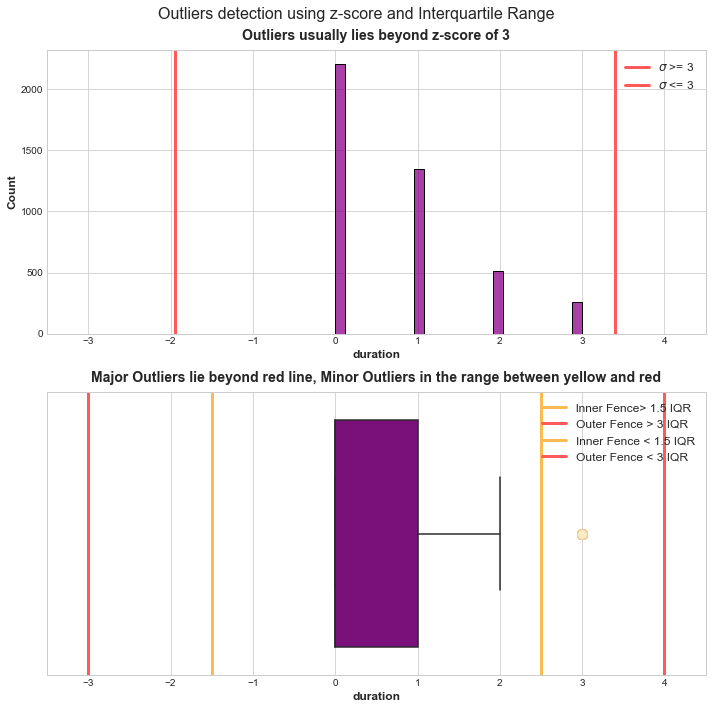

In [9]:
print(data.groupby(['duration'])['duration'].count())
plot_feature_outlier(data, 'duration', low_z=True,high_z=True,low_fence=True,high_fence=True,inner_fence=True,z=False)

#### Histogram of the rest of the features

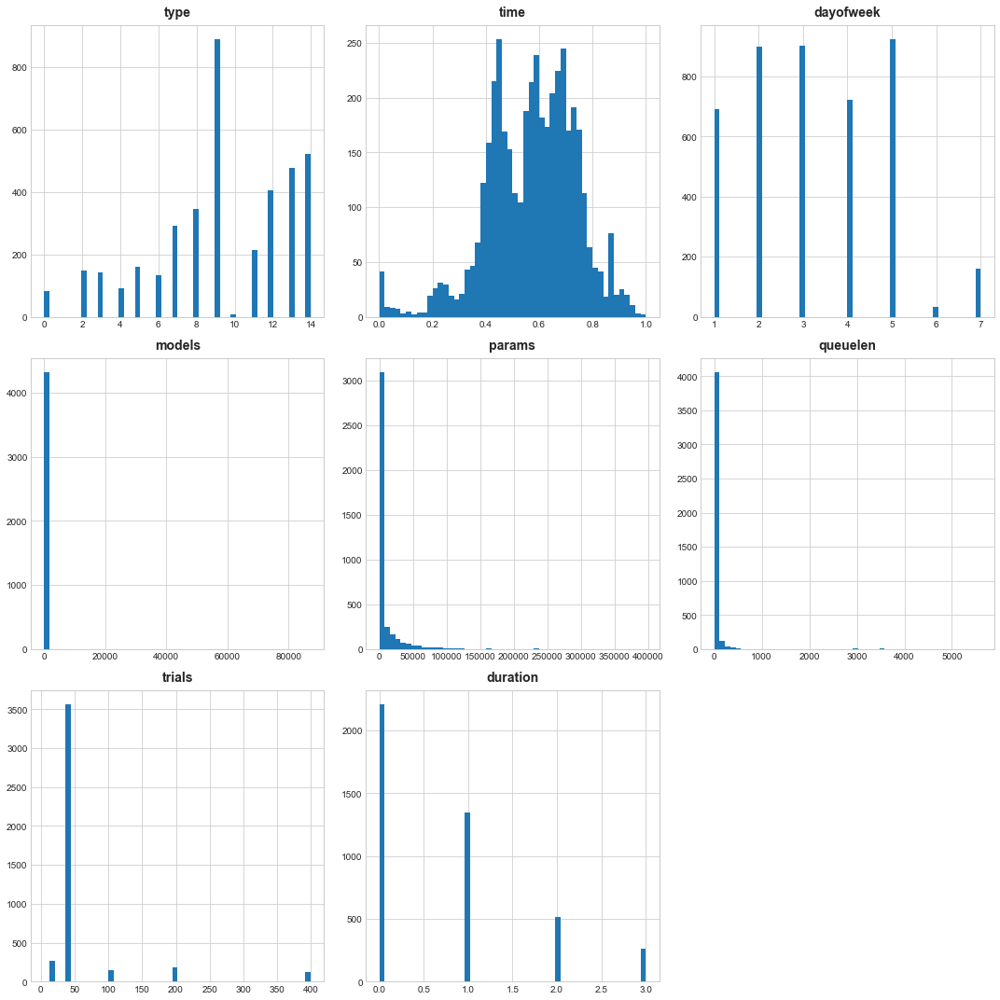

In [10]:
data.hist(figsize=(15,15), bins=50)
plt.show()

<a id='summary'><a>
    
### 1A)a)Summary
    
[Back To Table](#table)

The features are all in numerical format and the data can separate into 2 core types:
1. Data which related to the model which has to be trained (attributes of the model)
- type (discrete)
- models (continuous) 
- params (continuous)




2. Data which related to the time and duration of the models are training (external factors)
- time (continuous)
- dayofweek (discrete)
- queuelen (continuous)
- trials (discrete)

**Lastly**  
- duration (dependent variable)

Target variable might be **imbalance** , might need to weight out 




There are missing values in **'type'** as well as **'params'** features 

### Sets of data 

1) cont_df  
2) discrete_df  
3) nonull_df  

In [7]:
cont_df = data[['models','params','time','queuelen']]
discrete_df = data[['type','dayofweek','trials']]

nonull_df = data[data.notnull().all(axis=1)]

---

<a id='corr'><a>
    
### 1B)Check the strength of relation between type and trials with duration
    
[Back To Table](#table)

#### Using pandas corr

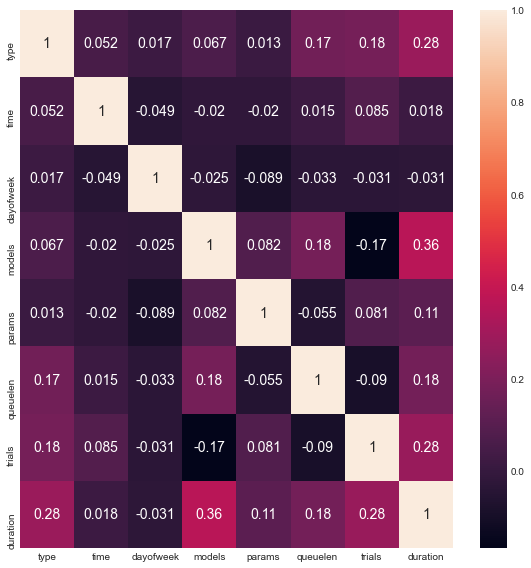

In [12]:
plt.figure( figsize=(8,8))
sns.heatmap(data.corr(method ='spearman'), annot=True, annot_kws={"size":14})
plt.show()

#### Using scipy correlation 

In [13]:
def get_corrs(data,y,method='pearson'):
    '''
        data: Pass in a dataframe
        y: the variable to compare with
        method: pearson , spearman 
        
    '''
    
    dic = {'dependent':[],'feature':[], 'correlation':[],'p-values':[]}
    for col in data.columns.values:
        if method == 'pearson':
            values, pv = pearsonr(data[data[col].notnull()][col], data.loc[data[data[col].notnull()].index.values,y])
        elif method == 'spearman':
            values, pv = spearmanr(data[data[col].notnull()][col], data.loc[data[data[col].notnull()].index.values,y])
        dic['dependent'].append(y)
        dic['feature'].append(col)
        dic['correlation'].append(values)
        dic['p-values'].append(pv)
    return pd.DataFrame.from_dict(dic)

In [14]:
get_corrs(data, 'duration')

,dependent,feature,correlation,p-values
0,duration,type,0.217945,3.655989e-43
1,duration,time,-0.013950,3.589211e-01
2,duration,dayofweek,-0.047224,1.888413e-03
3,duration,models,0.007583,6.180322e-01
4,duration,params,-0.023497,1.379591e-01
5,duration,queuelen,0.136960,1.438649e-19
6,duration,trials,0.361261,1.532141e-133
7,duration,duration,1.000000,0.000000e+00


#### Use MI to find correlation

In [15]:
# only rows that have no nan values
data.loc[data.notnull().all(axis=1).values,:].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3593 entries, 0 to 4327
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   type       3593 non-null   float64
 1   time       3593 non-null   float64
 2   dayofweek  3593 non-null   float64
 3   models     3593 non-null   float64
 4   params     3593 non-null   float64
 5   queuelen   3593 non-null   float64
 6   trials     3593 non-null   float64
 7   duration   3593 non-null   float64
dtypes: float64(8)
memory usage: 252.6 KB


In [16]:
data.iloc[data.notnull().all(axis=1).values,:-1]

,type,time,dayofweek,models,params,queuelen,trials
0,13.0,0.568056,2.0,148.0,11252.0,0.0,40.0
1,12.0,0.715972,2.0,7.0,5923.0,0.0,40.0
2,13.0,0.222917,5.0,62.0,1906.0,1.0,20.0
3,5.0,0.424306,5.0,8.0,4023.0,30.0,40.0
4,12.0,0.672222,5.0,1.0,2480.0,0.0,40.0
...,...,...,...,...,...,...,...
4323,9.0,0.552083,1.0,6.0,2172.0,3490.0,40.0
4324,14.0,0.643750,3.0,15.0,3259.0,0.0,40.0
4325,13.0,0.444444,2.0,34.0,4754.0,0.0,40.0
4326,8.0,0.704167,5.0,16.0,30957.0,0.0,40.0


In [17]:
y = np.array(data.iloc[data.notnull().all(axis=1).values,:]['duration'].values, dtype='int8')

In [18]:
discrete = [True  if i in discrete_df.columns.values else False for i in data.columns.values[:-1]]

In [19]:
discrete

[True, False, True, False, False, False, True]

In [20]:
mi = mutual_info_classif(data.iloc[data.notnull().all(axis=1).values,:-1],y , discrete_features=discrete)

### Use a non parametric method

In [21]:
rf = RandomForestClassifier(n_jobs=-1, random_state=0)
rf.fit(nonull_df.values[:, :-1], nonull_df.values[:,-1])

RandomForestClassifier(n_jobs=-1, random_state=0)

In [22]:
pi_score=permutation_importance(rf,nonull_df.values[:, :-1], nonull_df.values[:,-1], random_state=0, scoring='neg_mean_squared_error')

In [23]:
pi_score

#create a dict of selected keys from the pi_score dict  
#pi = { i:pi_score[i] for i in [*pi_score.keys()][:2]}

# unload the values from pi_score.values() into a list
pi = [*pi_score.values()][:2]
np.array(pi).T

array([[0.60211522, 0.01171402],
       [0.10603952, 0.00291903],
       [0.07542444, 0.00461708],
       [0.62710827, 0.0132316 ],
       [0.28989702, 0.01310123],
       [0.12518787, 0.0052731 ],
       [0.21118842, 0.00490473]])

In [24]:
pi = pd.DataFrame(np.array(pi).T,index = nonull_df.iloc[:,:-1].columns.values,columns=[*pi_score][:2])
pi.sort_values(by='importances_mean', ascending=False)

,importances_mean,importances_std
models,0.627108,0.013232
type,0.602115,0.011714
params,0.289897,0.013101
trials,0.211188,0.004905
queuelen,0.125188,0.005273
time,0.106040,0.002919
dayofweek,0.075424,0.004617


### Conflict in the correlation results from MI and spearman correlation  and Permutation importance

In [25]:
MI = pd.Series(mi, name="MI Scores", index=data.iloc[data.notnull().all(axis=1).values,:-1].columns)
MI = MI.sort_values(ascending=False)

print(MI.round(4)[:10].to_markdown())

|           |   MI Scores |
|:----------|------------:|
| type      |      0.2372 |
| params    |      0.1968 |
| models    |      0.1787 |
| time      |      0.1493 |
| trials    |      0.082  |
| queuelen  |      0.0561 |
| dayofweek |      0.0113 |


In [26]:
get_corrs(data, 'duration').sort_values(by='correlation', ascending=False)

,dependent,feature,correlation,p-values
7,duration,duration,1.000000,0.000000e+00
6,duration,trials,0.361261,1.532141e-133
0,duration,type,0.217945,3.655989e-43
5,duration,queuelen,0.136960,1.438649e-19
3,duration,models,0.007583,6.180322e-01
1,duration,time,-0.013950,3.589211e-01
4,duration,params,-0.023497,1.379591e-01
2,duration,dayofweek,-0.047224,1.888413e-03


### Inference with Groupby

In [27]:
data.groupby(['trials','duration'])['trials'].count()

trials  duration
5.0     1.0            1
20.0    0.0          174
        1.0           73
        2.0           21
        3.0            4
22.0    0.0            7
        1.0            2
30.0    0.0            1
        3.0            1
40.0    0.0         1959
        1.0         1078
        2.0          366
        3.0          161
60.0    0.0            2
        1.0            1
80.0    0.0            3
        1.0            3
        3.0            1
100.0   0.0           15
        1.0           76
        2.0           59
        3.0            3
200.0   0.0           48
        1.0           82
        2.0           52
        3.0            6
250.0   1.0            1
300.0   1.0            2
400.0   1.0           26
        2.0           16
        3.0           83
Name: trials, dtype: int64

From the graph it seems that trials does have some relations with duration
The discrepancy between the 2 methods suggest that there could be interactions between params and trials
The high correlation between the 2 variables and dependent would also meant that it would not be wise to 
deleted the rows with  missing columns and it will be better to find ways to impute the null values properly


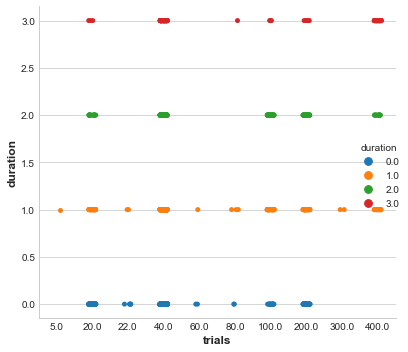

In [28]:
print('From the graph it seems that trials does have some relations with duration')
print('The discrepancy between the 2 methods suggest that there could be interactions between params and trials')
print('The high correlation between the 2 variables and dependent would also meant that it would not be wise to \n\
deleted the rows with  missing columns and it will be better to find ways to impute the null values properly')
g = sns.catplot(x="trials", y="duration", hue="duration",data=data.loc[data.notnull().all(axis=1).values,:])

In [29]:
data[['type','models','trials']]

,type,models,trials
0,13.0,148.0,40.0
1,12.0,7.0,40.0
2,13.0,62.0,20.0
3,5.0,8.0,40.0
4,12.0,1.0,40.0
...,...,...,...
4326,8.0,16.0,40.0
4327,14.0,1.0,200.0
4328,NaN,31.0,40.0
4329,9.0,5.0,40.0


In [30]:
data[data.notnull().all(axis=1)]

,type,time,dayofweek,models,params,queuelen,trials,duration
0,13.0,0.568056,2.0,148.0,11252.0,0.0,40.0,2.0
1,12.0,0.715972,2.0,7.0,5923.0,0.0,40.0,1.0
2,13.0,0.222917,5.0,62.0,1906.0,1.0,20.0,0.0
3,5.0,0.424306,5.0,8.0,4023.0,30.0,40.0,0.0
4,12.0,0.672222,5.0,1.0,2480.0,0.0,40.0,1.0
...,...,...,...,...,...,...,...,...
4323,9.0,0.552083,1.0,6.0,2172.0,3490.0,40.0,1.0
4324,14.0,0.643750,3.0,15.0,3259.0,0.0,40.0,1.0
4325,13.0,0.444444,2.0,34.0,4754.0,0.0,40.0,0.0
4326,8.0,0.704167,5.0,16.0,30957.0,0.0,40.0,0.0


In [42]:
data[data.notnull().all(axis=1)].iloc[:,:-1]

,type,time,dayofweek,models,params,queuelen,trials
0,13.0,0.568056,2.0,148.0,11252.0,0.0,40.0
1,12.0,0.715972,2.0,7.0,5923.0,0.0,40.0
2,13.0,0.222917,5.0,62.0,1906.0,1.0,20.0
3,5.0,0.424306,5.0,8.0,4023.0,30.0,40.0
4,12.0,0.672222,5.0,1.0,2480.0,0.0,40.0
...,...,...,...,...,...,...,...
4323,9.0,0.552083,1.0,6.0,2172.0,3490.0,40.0
4324,14.0,0.643750,3.0,15.0,3259.0,0.0,40.0
4325,13.0,0.444444,2.0,34.0,4754.0,0.0,40.0
4326,8.0,0.704167,5.0,16.0,30957.0,0.0,40.0


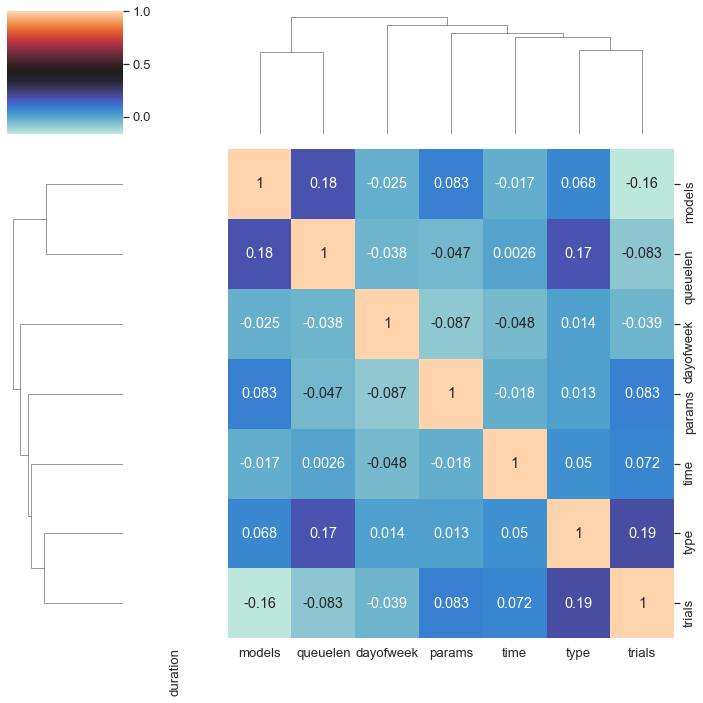

In [139]:
sns.set_palette('icefire')
lut = dict(zip(data['duration'].unique(), "rgb"))
row_colors = data['duration'].map(lut)
sns.set(font_scale=1.2)
g = sns.clustermap(data[data.notnull().all(axis=1)].iloc[:,:-1].corr(method='spearman'), row_colors=row_colors, method='ward',cmap="icefire", annot=True)

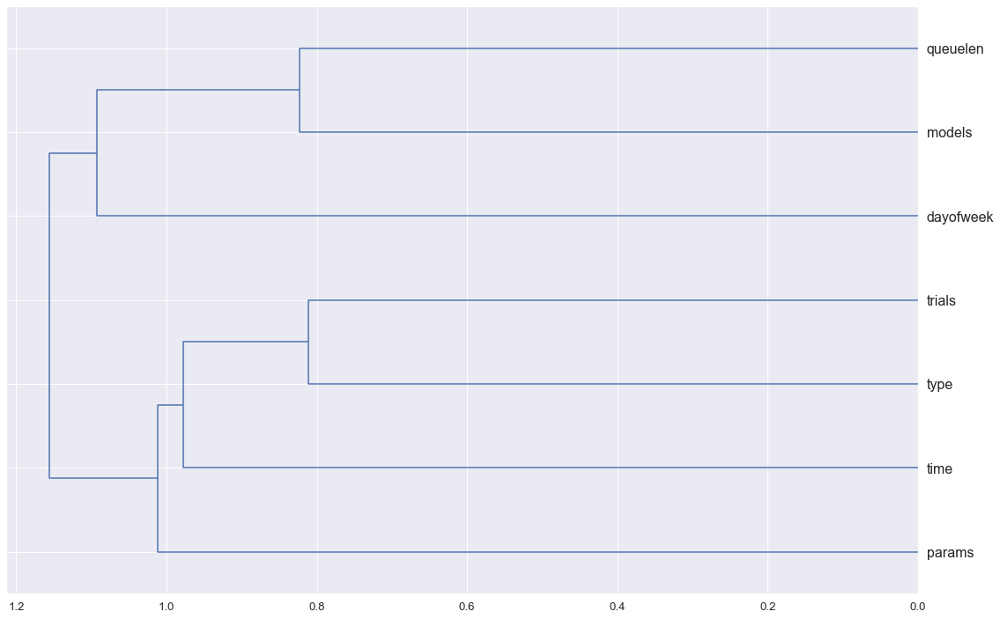

In [52]:
import scipy
from scipy.cluster.hierarchy import dendrogram, linkage
import scipy.cluster.hierarchy as hc
from scipy.spatial.distance import pdist

corr = np.round(scipy.stats.spearmanr(data[data.notnull().all(axis=1)].iloc[:,:-1]).correlation, 4)
corr_condensed = hc.distance.squareform(1-corr)
z = hc.linkage(corr_condensed, method='ward')
fig = plt.figure(figsize=(16,10))
dendrogram = hc.dendrogram(z, labels=data[data.notnull().all(axis=1)].iloc[:,:-1].columns, orientation='left', leaf_font_size=16)
plt.show()

<a id='imputstra'><a>
    
### 1c)Summary on imputation strategy
    
[Back To Table](#table)

There are more than 400 missing values in both 'type' and 'params' features.
That is about 10% of the data approximately 
Given that correlation results show that the 2 variables have strong relation with the dependent variable,  
we would lose lots of information if we delete the empty rows.
At the same time we will want to impute them carefully as it might distort the predict results as the 2 variables have strong correlation with the dependent variable.

So the course of action decided will be :
1) delete rows that have both nulls values in 'type' as well as 'params' as we need to impute too much information   
2) will use KNNimputer to impute values in 'params'   
3) will be creating a new category for the null values in 'type' as one_hot encode the feature  

Create a separate set with all null rows deleted and train it as base model

In [53]:
print(data.info())
print(data[data['type'].isnull() & data['params'].isnull()].info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4327 entries, 0 to 4330
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   type       3901 non-null   float64
 1   time       4327 non-null   float64
 2   dayofweek  4327 non-null   float64
 3   models     4327 non-null   float64
 4   params     3987 non-null   float64
 5   queuelen   4327 non-null   float64
 6   trials     4327 non-null   float64
 7   duration   4327 non-null   float64
dtypes: float64(8)
memory usage: 433.3 KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 32 entries, 19 to 4154
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   type       0 non-null      float64
 1   time       32 non-null     float64
 2   dayofweek  32 non-null     float64
 3   models     32 non-null     float64
 4   params     0 non-null      float64
 5   queuelen   32 non-null     float64
 6   trials     32 non

<a id='naive'><a>
    
### 1d) Train naive Model on Dataset with NULL eliminated
    
[Back To Table](#table)

In [54]:
nonull_df
naive_y = nonull_df['duration']
naive_x = nonull_df.drop('duration', axis=1)

naive_x_train, naive_x_test, naive_y_train, naive_y_test =  train_test_split(naive_x, naive_y, test_size=0.2, random_state=0, stratify=y) 

---

#### RandomForest CV

In [55]:
rf = RandomForestClassifier(n_estimators=100)
cross_val_score(rf, naive_x, naive_y, cv=5, scoring='accuracy')

array([0.85396384, 0.82197497, 0.82892907, 0.81337047, 0.82451253])

In [56]:
cross_validate(rf, naive_x, naive_y, cv=5)

{'fit_time': array([0.32263613, 0.2710371 , 0.29902625, 0.31614137, 0.32818031]),
 'score_time': array([0.01898432, 0.02099872, 0.02099681, 0.02107549, 0.02000117]),
 'test_score': array([0.85257302, 0.82058414, 0.8178025 , 0.81754875, 0.83147632])}

In [57]:
cross_validate(rf, naive_x, naive_y, cv=5, scoring=('accuracy','roc_auc_ovr'))

{'fit_time': array([0.30476642, 0.27279949, 0.3102529 , 0.28513789, 0.30108166]),
 'score_time': array([0.04399204, 0.03999877, 0.04100204, 0.03998613, 0.05196309]),
 'test_accuracy': array([0.85257302, 0.81502086, 0.82892907, 0.81337047, 0.83426184]),
 'test_roc_auc_ovr': array([0.9542047 , 0.94560075, 0.94257114, 0.94931737, 0.9441576 ])}

---

#### LogisticRegression CV


In [58]:
y = label_binarize(naive_y, classes=[0,1,2,3])
scale = StandardScaler()
scale.fit(naive_x.values)
naive_x_scaled = scale.transform(naive_x.values)

In [59]:
lg = LogisticRegression(max_iter=100, multi_class='multinomial')
cross_val_score(lg, naive_x_scaled, naive_y, cv=5, scoring='accuracy')

array([0.54937413, 0.57858136, 0.60917942, 0.59331476, 0.56685237])

In [60]:
cross_validate(lg, naive_x_scaled, naive_y, cv=5, scoring=('accuracy','roc_auc_ovr'))

{'fit_time': array([0.01864028, 0.01803041, 0.03307962, 0.01901174, 0.01596832]),
 'score_time': array([0.00251269, 0.00400901, 0.00399256, 0.00300026, 0.00303125]),
 'test_accuracy': array([0.54937413, 0.57858136, 0.60917942, 0.59331476, 0.56685237]),
 'test_roc_auc_ovr': array([0.68752775, 0.6663892 , 0.73043522, 0.71496722, 0.67579631])}

#### No cv

In [66]:
rf = RandomForestClassifier(n_estimators=100, random_state=0)
rf.fit(naive_x_train, naive_y_train)
pred =  rf.predict(naive_x_test)
print(accuracy_score(pred, naive_y_test))
roc_auc_score(naive_y_test, rf.predict_proba(naive_x_test), multi_class='ovr')

0.8233657858136301


0.9405588481650646

In [67]:
# show the labels
rf.classes_

array([0., 1., 2., 3.])

In [68]:
lg = LogisticRegression()
lg.fit(naive_x_train, naive_y_train)
pred2 =  lg.predict(naive_x_test)

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


### Metrics on Classification

In [69]:
data.groupby(['duration'])['duration'].count()

duration
0.0    2209
1.0    1345
2.0     514
3.0     259
Name: duration, dtype: int64

              precision    recall  f1-score   support

         0.0       0.95      0.87      0.91       399
         1.0       0.72      0.78      0.75       208
         2.0       0.60      0.72      0.65        71
         3.0       0.72      0.76      0.74        41

    accuracy                           0.82       719
   macro avg       0.75      0.78      0.76       719
weighted avg       0.84      0.82      0.83       719

[[347  48   4   0]
 [ 17 163  27   1]
 [  0   9  51  11]
 [  1   6   3  31]]


FixedFormatter should only be used together with FixedLocator


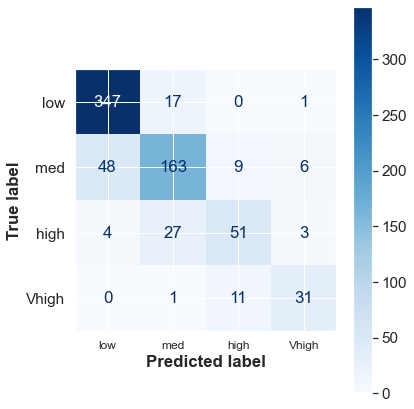

In [70]:
print(classification_report(pred, naive_y_test))
print(confusion_matrix(pred, naive_y_test))

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.4)
ax.set_xticklabels(ax.get_xticks(), size = 12)
plot_confusion_matrix(rf,naive_x_test,naive_y_test, 
                      cmap=plt.cm.Blues,
                      #normalize='true',  
                      display_labels=['low','med','high','Vhigh'],
                      ax=ax
                     )
plt.show()

<a id='startclean'><a>
    
### 1e) Delete and Impute
    
[Back To Table](#table)

#### Delete rows which has nulls in both type and params

In [71]:
data_trim = data[~(data['type'].isna()) | ~(data['params'].isna())]
for col in ['type','params']:
    data_trim[col + '_was_missing'] = data_trim[col].isnull().values


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [72]:
data_trim.columns

Index(['type', 'time', 'dayofweek', 'models', 'params', 'queuelen', 'trials',
       'duration', 'type_was_missing', 'params_was_missing'],
      dtype='object')

#### KNNimpute 'params' feature

Impute both 'type' and 'params' with knnimputer and round them down 

In [73]:
imputer = KNNImputer(n_neighbors = 5)
data_imputed = imputer.fit_transform(data_trim)


np.set_printoptions(suppress=True)
data_imputed = pd.DataFrame(data_imputed, columns = data_trim.columns.values)
data_imputed[['type','params']] = data_imputed[['type','params']].round()
data_imputed.head()

,type,time,dayofweek,models,params,queuelen,trials,duration,type_was_missing,params_was_missing
0,13.0,0.568056,2.0,148.0,11252.0,0.0,40.0,2.0,0.0,0.0
1,12.0,0.715972,2.0,7.0,5923.0,0.0,40.0,1.0,0.0,0.0
2,13.0,0.222917,5.0,62.0,1906.0,1.0,20.0,0.0,0.0,0.0
3,5.0,0.424306,5.0,8.0,4023.0,30.0,40.0,0.0,0.0,0.0
4,12.0,0.672222,5.0,1.0,2480.0,0.0,40.0,1.0,0.0,0.0




<a id='testimpute'><a>
    
### 1f)Test base model with imputed data

    
[Back To Table](#table)

### Random Forest

In [74]:
rf= RandomForestClassifier(n_estimators =100, random_state=0)

data_imputed_y = data_imputed[['duration']]
data_imputed_x = data_imputed.drop('duration', axis=1)

train_x, test_x , train_y, test_y = train_test_split(data_imputed_x, data_imputed_y, test_size=0.2, random_state=0)

In [75]:
cross_validate(rf, data_imputed_x, data_imputed_y.values.ravel(), cv=5, scoring=('accuracy','roc_auc_ovr'))

{'fit_time': array([0.38579798, 0.40120745, 0.36815548, 0.37694097, 0.39267635]),
 'score_time': array([0.04597235, 0.0489552 , 0.04498839, 0.04755425, 0.04700041]),
 'test_accuracy': array([0.84051222, 0.79394645, 0.81140861, 0.80209546, 0.81722934]),
 'test_roc_auc_ovr': array([0.95009647, 0.93773448, 0.94072545, 0.94437644, 0.94561267])}

In [76]:
rf= RandomForestClassifier(n_estimators =100, random_state=0)
rf.fit(train_x, train_y.values.ravel())
pred = rf.predict(test_x)
print(accuracy_score(pred, test_y))
print(f1_score(pred, test_y, average='weighted'))
print(roc_auc_score(test_y, rf.predict_proba(test_x), multi_class='ovr'))

0.79976717112922
0.8036278763081316
0.9359799302579823


              precision    recall  f1-score   support

         0.0       0.92      0.88      0.90       466
         1.0       0.72      0.71      0.71       266
         2.0       0.52      0.69      0.60        78
         3.0       0.71      0.71      0.71        49

    accuracy                           0.80       859
   macro avg       0.72      0.75      0.73       859
weighted avg       0.81      0.80      0.80       859

[[410  51   3   2]
 [ 33 188  39   6]
 [  1  17  54   6]
 [  2   5   7  35]]


FixedFormatter should only be used together with FixedLocator


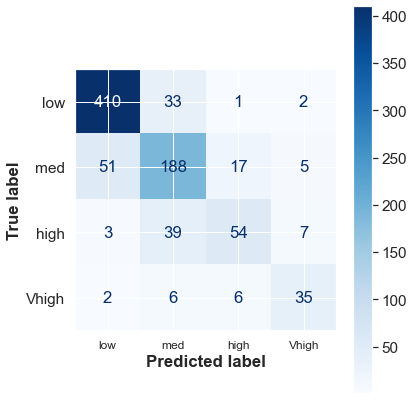

In [77]:
print(classification_report(pred, test_y.values.ravel()))
print(confusion_matrix(pred, test_y.values.ravel()))

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.4)
ax.set_xticklabels(ax.get_xticks(), size = 12)
plot_confusion_matrix(rf,test_x,test_y.values.ravel(), 
                      cmap=plt.cm.Blues,
                      #normalize='true',  
                      display_labels=['low','med','high','Vhigh'],
                      ax=ax
                     )
plt.show()

From the scores it seems that the models find it harder to predict label high 

### Logistic Regression

In [78]:
lg = LogisticRegression(max_iter=10000)

In [79]:
data_imputed_y = data_imputed[['duration']]
data_imputed_x = data_imputed.drop('duration', axis=1)

train_x, test_x , train_y, test_y = train_test_split(data_imputed_x, data_imputed_y, test_size=0.2, random_state=0)

#### Scale data for logistic regression 

In [80]:
scaler= StandardScaler()
scaler.fit(data_imputed_x)
data_imputed_x_scaled = scaler.transform(data_imputed_x)

In [81]:
data_imputed_x.head()

,type,time,dayofweek,models,params,queuelen,trials,type_was_missing,params_was_missing
0,13.0,0.568056,2.0,148.0,11252.0,0.0,40.0,0.0,0.0
1,12.0,0.715972,2.0,7.0,5923.0,0.0,40.0,0.0,0.0
2,13.0,0.222917,5.0,62.0,1906.0,1.0,20.0,0.0,0.0
3,5.0,0.424306,5.0,8.0,4023.0,30.0,40.0,0.0,0.0
4,12.0,0.672222,5.0,1.0,2480.0,0.0,40.0,0.0,0.0


In [82]:
np.set_printoptions(threshold=1000)

ct = ColumnTransformer([
        ('scaler', StandardScaler(), ['models', 'params','queuelen','trials'])
    ], remainder='passthrough')

data_imputed_x_scaled = ct.fit_transform(data_imputed_x)

In [83]:
pd.DataFrame(data_imputed_x_scaled, columns= ['models', 'params','queuelen','trials']+ [i  for i in data_imputed_x.columns.values if i not in ['models', 'params','queuelen','trials']])

,models,params,queuelen,trials,type,time,dayofweek,type_was_missing,params_was_missing
0,0.044473,0.017223,-0.150058,-0.267715,13.0,0.568056,2.0,0.0,0.0
1,-0.038080,-0.192222,-0.150058,-0.267715,12.0,0.715972,2.0,0.0,0.0
2,-0.005879,-0.350101,-0.147260,-0.559288,13.0,0.222917,5.0,0.0,0.0
3,-0.037495,-0.266897,-0.066093,-0.267715,5.0,0.424306,5.0,0.0,0.0
4,-0.041593,-0.327541,-0.150058,-0.267715,12.0,0.672222,5.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
4290,-0.032811,0.791683,-0.150058,-0.267715,8.0,0.704167,5.0,0.0,0.0
4291,-0.041593,-0.373329,-0.150058,2.064873,14.0,0.503472,5.0,0.0,0.0
4292,-0.024029,-0.365783,0.213791,-0.267715,9.0,0.925694,1.0,1.0,0.0
4293,-0.039251,-0.178505,-0.150058,-0.267715,9.0,0.435417,2.0,0.0,1.0


In [84]:
cross_validate(lg, data_imputed_x_scaled, data_imputed_y.values.ravel(), cv=5 , scoring=['accuracy', 'roc_auc_ovr'])

{'fit_time': array([0.28137851, 0.22259712, 0.4762125 , 0.31858516, 0.34826708]),
 'score_time': array([0.00399303, 0.00399828, 0.00300789, 0.00499272, 0.00499725]),
 'test_accuracy': array([0.55529686, 0.5878929 , 0.61001164, 0.58440047, 0.56461001]),
 'test_roc_auc_ovr': array([0.68284687, 0.68517168, 0.74080991, 0.69644036, 0.67846561])}

In [85]:
train_x_scaled = ct.fit_transform(train_x)
test_x_scaled = ct.transform(test_x)

lg.fit(train_x_scaled, train_y.values.ravel())
pred = lg.predict(test_x_scaled)
print(accuracy_score(pred, test_y))
print(f1_score(pred, test_y, average='weighted'))
print(roc_auc_score(test_y, lg.predict_proba(test_x_scaled), multi_class='ovr'))

0.5983701979045402
0.6417225501559235
0.7041915420641707


### KNN 

#### Scale for distance

In [86]:
minmax = ColumnTransformer([
        ('scaler', MinMaxScaler(), ['models', 'params','queuelen','trials'])
    ], remainder='passthrough')

data_imputed_x_minmax= minmax.fit_transform(data_imputed_x)

In [87]:
scaler = MinMaxScaler()
data_imputed_x_minmax = scaler.fit_transform(data_imputed_x)

In [88]:
pd.DataFrame(data_imputed_x_minmax, columns= ['models', 'params','queuelen','trials']+ [i  for i in data_imputed_x.columns.values if i not in ['models', 'params','queuelen','trials']]).head()

,models,params,queuelen,trials,type,time,dayofweek,type_was_missing,params_was_missing
0,0.928571,0.568150,0.166667,0.001684,0.028190,0.000000,0.088608,0.0,0.0
1,0.857143,0.716273,0.166667,0.000069,0.014754,0.000000,0.088608,0.0,0.0
2,0.928571,0.222531,0.666667,0.000699,0.004626,0.000178,0.037975,0.0,0.0
3,0.357143,0.424200,0.666667,0.000080,0.009964,0.005352,0.088608,0.0,0.0
4,0.857143,0.672462,0.666667,0.000000,0.006074,0.000000,0.088608,0.0,0.0


In [89]:
knn = KNeighborsClassifier(n_neighbors=10 , n_jobs=-1)

cross_validate(knn, data_imputed_x_minmax, data_imputed_y.values.ravel(), cv=5 , scoring=['accuracy', 'roc_auc_ovr'])

{'fit_time': array([0.01199269, 0.00900126, 0.0069859 , 0.00900102, 0.0069983 ]),
 'score_time': array([2.31080365, 0.05754113, 0.06154871, 0.06800151, 0.07000232]),
 'test_accuracy': array([0.67636787, 0.64959255, 0.69732247, 0.67054715, 0.65308498]),
 'test_roc_auc_ovr': array([0.78400634, 0.77931526, 0.80197249, 0.80140669, 0.77774456])}

In [90]:
train_x_minmax = minmax.fit_transform(train_x)
test_x_minmax = minmax.transform(test_x)

knn.fit(train_x_minmax, train_y.values.ravel())
pred = lg.predict(test_x_minmax)
print(accuracy_score(pred, test_y))
print(f1_score(pred, test_y, average='weighted'))
print(roc_auc_score(test_y, knn.predict_proba(test_x_minmax), multi_class='ovr'))

0.5890570430733411
0.6462463866848097
0.8086810748739462


### SVM

In [91]:
svm = SVC(kernel='poly', degree=3, decision_function_shape='ovr')

In [92]:
ct = ColumnTransformer([
        ('scaler', StandardScaler(), ['models', 'params','queuelen','trials'])
    ], remainder='passthrough')

data_imputed_x_scaled = ct.fit_transform(data_imputed_x)

In [93]:
scaler= StandardScaler()
scaler.fit(data_imputed_x)
data_imputed_x_scaled = scaler.transform(data_imputed_x)

In [94]:
cross_validate(svm, data_imputed_x_scaled, data_imputed_y.values.ravel(), cv=5 )

{'fit_time': array([0.71586442, 0.53303456, 0.57439113, 0.64126205, 0.59200335]),
 'score_time': array([0.0629704 , 0.05996752, 0.06405115, 0.06099987, 0.06100106]),
 'test_score': array([0.59254948, 0.59022119, 0.60186263, 0.59138533, 0.56926659])}

In [95]:
train_x_scaled = ct.fit_transform(train_x)
test_x_scaled = ct.transform(test_x)

svm.fit(train_x_scaled, train_y.values.ravel())
pred = svm.predict(test_x_scaled)
print(accuracy_score(pred, test_y))
print(f1_score(pred, test_y, average='weighted'))
#print(roc_auc_score(test_y, svm.predict_proba(test_x_scaled), multi_class='ovr'))

0.5948777648428405
0.6340686095336623



<a id='features'><a>
    
### 2) Feature Engineering

    
[Back To Table](#table)

<a id='interactions'><a>
    
### 2a) Feature Interactions
[Back To Table](#table)
    

### Check out for interaction effects between features 

In [96]:
data_imputed_y = data_imputed[['duration']]
data_imputed_x = data_imputed.drop('duration', axis=1)

poly = PolynomialFeatures(interaction_only=True)

In [97]:
data_imputed_x

,type,time,dayofweek,models,params,queuelen,trials,type_was_missing,params_was_missing
0,13.0,0.568056,2.0,148.0,11252.0,0.0,40.0,0.0,0.0
1,12.0,0.715972,2.0,7.0,5923.0,0.0,40.0,0.0,0.0
2,13.0,0.222917,5.0,62.0,1906.0,1.0,20.0,0.0,0.0
3,5.0,0.424306,5.0,8.0,4023.0,30.0,40.0,0.0,0.0
4,12.0,0.672222,5.0,1.0,2480.0,0.0,40.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
4290,8.0,0.704167,5.0,16.0,30957.0,0.0,40.0,0.0,0.0
4291,14.0,0.503472,5.0,1.0,1315.0,0.0,200.0,0.0,0.0
4292,9.0,0.925694,1.0,31.0,1507.0,130.0,40.0,1.0,0.0
4293,9.0,0.435417,2.0,5.0,6272.0,0.0,40.0,0.0,1.0


### create polynomial feature interactions only

In [98]:
polyct = ColumnTransformer([('poly', PolynomialFeatures(degree=3,interaction_only=True),['type','models','params','trials'] )], remainder='passthrough')

data_poly = polyct.fit_transform(data_imputed_x)

>*poly_x0 is type*  
>*poly_x1 is models*  
>*poly_x2 is params*  
>*poly_x3 is trials*  


In [99]:
polyct.get_feature_names()

data_poly = pd.DataFrame(data_poly, columns = polyct.get_feature_names())

In [100]:
data_poly

,poly__1,poly__x0,poly__x1,poly__x2,poly__x3,poly__x0 x1,poly__x0 x2,poly__x0 x3,poly__x1 x2,poly__x1 x3,poly__x2 x3,poly__x0 x1 x2,poly__x0 x1 x3,poly__x0 x2 x3,poly__x1 x2 x3,time,dayofweek,queuelen,type_was_missing,params_was_missing
0,1.0,13.0,148.0,11252.0,40.0,1924.0,146276.0,520.0,1665296.0,5920.0,450080.0,21648848.0,76960.0,5851040.0,66611840.0,0.568056,2.0,0.0,0.0,0.0
1,1.0,12.0,7.0,5923.0,40.0,84.0,71076.0,480.0,41461.0,280.0,236920.0,497532.0,3360.0,2843040.0,1658440.0,0.715972,2.0,0.0,0.0,0.0
2,1.0,13.0,62.0,1906.0,20.0,806.0,24778.0,260.0,118172.0,1240.0,38120.0,1536236.0,16120.0,495560.0,2363440.0,0.222917,5.0,1.0,0.0,0.0
3,1.0,5.0,8.0,4023.0,40.0,40.0,20115.0,200.0,32184.0,320.0,160920.0,160920.0,1600.0,804600.0,1287360.0,0.424306,5.0,30.0,0.0,0.0
4,1.0,12.0,1.0,2480.0,40.0,12.0,29760.0,480.0,2480.0,40.0,99200.0,29760.0,480.0,1190400.0,99200.0,0.672222,5.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4290,1.0,8.0,16.0,30957.0,40.0,128.0,247656.0,320.0,495312.0,640.0,1238280.0,3962496.0,5120.0,9906240.0,19812480.0,0.704167,5.0,0.0,0.0,0.0
4291,1.0,14.0,1.0,1315.0,200.0,14.0,18410.0,2800.0,1315.0,200.0,263000.0,18410.0,2800.0,3682000.0,263000.0,0.503472,5.0,0.0,0.0,0.0
4292,1.0,9.0,31.0,1507.0,40.0,279.0,13563.0,360.0,46717.0,1240.0,60280.0,420453.0,11160.0,542520.0,1868680.0,0.925694,1.0,130.0,1.0,0.0
4293,1.0,9.0,5.0,6272.0,40.0,45.0,56448.0,360.0,31360.0,200.0,250880.0,282240.0,1800.0,2257920.0,1254400.0,0.435417,2.0,0.0,0.0,1.0


In [101]:
data_poly['params/model'] = data_poly['poly__x2']/data_poly['poly__x1']

In [102]:

cross_validate(rf, data_poly, data_imputed_y.values.ravel(), cv=5, scoring=('accuracy','roc_auc_ovr'))

{'fit_time': array([0.58199358, 0.56013536, 0.56876326, 0.5669806 , 0.56742716]),
 'score_time': array([0.04700017, 0.04300046, 0.04597354, 0.04498482, 0.04398966]),
 'test_accuracy': array([0.82654249, 0.77997672, 0.78928987, 0.79161816, 0.79045402]),
 'test_roc_auc_ovr': array([0.93664344, 0.92417988, 0.93161093, 0.93228874, 0.93121003])}

In [103]:
discrete = [True  if i in discrete_df.columns.values else False for i in data_poly.columns.values]

mi = mutual_info_classif(data_poly, data_imputed_y.values.ravel() , discrete_features=discrete)

In [104]:
MI = pd.Series(mi, name="MI Scores", index=data_poly.columns)
MI = MI.sort_values(ascending=False)

print(MI.round(4)[:10].to_markdown())

|                |   MI Scores |
|:---------------|------------:|
| poly__x0 x1 x3 |      0.3732 |
| poly__x0 x1    |      0.3171 |
| poly__x0 x3    |      0.2733 |
| poly__x1 x3    |      0.2544 |
| poly__x2 x3    |      0.2026 |
| poly__x1 x2 x3 |      0.2021 |
| poly__x0       |      0.1995 |
| poly__x1       |      0.1896 |
| poly__x2       |      0.1863 |
| poly__x0 x2 x3 |      0.1816 |


In [105]:
rf= RandomForestClassifier(n_estimators =100, random_state=0)

base_list = [ 'time', 'dayofweek', 'queuelen',
         'type_was_missing', 'params_was_missing']

base_list2 = ['time','type_was_missing', 'params_was_missing']


add_listori = ['poly__x0','poly__x1','poly__x2', 'poly__x3']  #0.8220539925191088
add_listbest = ['poly__x0','poly__x1','poly__x2','poly__x0 x3'] #0.823447715075622
add_list = ['poly__x0','poly__x1','poly__x2', 'poly__x0 x1','poly__x0 x3','poly__x1 x3','poly__x2 x3','poly__x0 x1 x3']
add_list2 = ['poly__x0','poly__x1','poly__x0 x3','poly__x2 x3']

bestg result add_list2
>*poly_x0 is type*  
>*poly_x1 is models*  
>*poly_x2 is params*  
>*poly_x3 is trials*  

poly__x0  
poly__x1  
poly__x0 x3 - type * trials  
poly__x2 x3 - params * trials  

In [106]:
#original
results = cross_validate(rf, data_poly[base_list+add_listori], data_imputed_y.values.ravel(), cv=10, scoring=('accuracy','f1_micro','f1_macro','roc_auc_ovr'))

print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.8172223125711499
f1_micro :  0.8172223125711499
f1_macro :  0.774233938277219
roc_auc_ovr :  0.9429484828654502


In [107]:
#best score
results = cross_validate(rf, data_poly[base_list+add_listbest], data_imputed_y.values.ravel(), cv=10, scoring=('accuracy','f1_micro','f1_macro','roc_auc_ovr'))
results.keys()
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.818861061419201
f1_micro :  0.818861061419201
f1_macro :  0.7774799599681104
roc_auc_ovr :  0.944300742540514


In [108]:
# new best
results = cross_validate(rf, data_poly[base_list+add_list2], data_imputed_y.values.ravel(), cv=10, scoring=('accuracy','f1_micro','f1_macro','roc_auc_ovr'))
results.keys()
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.822114706998428
f1_micro :  0.822114706998428
f1_macro :  0.7776034697035055
roc_auc_ovr :  0.9461214081301259


No CV

In [109]:
train_x, test_x , train_y, test_y = train_test_split(data_poly[base_list+add_list2], data_imputed_y.values.ravel(), test_size=0.2, random_state=42)

rf= RandomForestClassifier(n_estimators =100, random_state=0)
rf.fit( train_x, train_y)
pred = rf.predict(test_x)
print(accuracy_score(pred, test_y))
print(f1_score(pred, test_y, average='weighted'))
print(roc_auc_score(test_y, rf.predict_proba(test_x), multi_class='ovr'))

0.810244470314319
0.8134695701464671
0.935895497393839


### PASS


<a id='time'><a>
    
### 2b) Bin time of day
    
[Back To Table](#table)
     

In [77]:
data_poly['hour'] = data_poly['time']*24

#=['early night','late night','early morning','late morning','early noon','late noon','early evening','late evening']
data_poly['hour']  = pd.cut(data_poly['hour'] ,labels=list(range(1,9)),  bins=8)

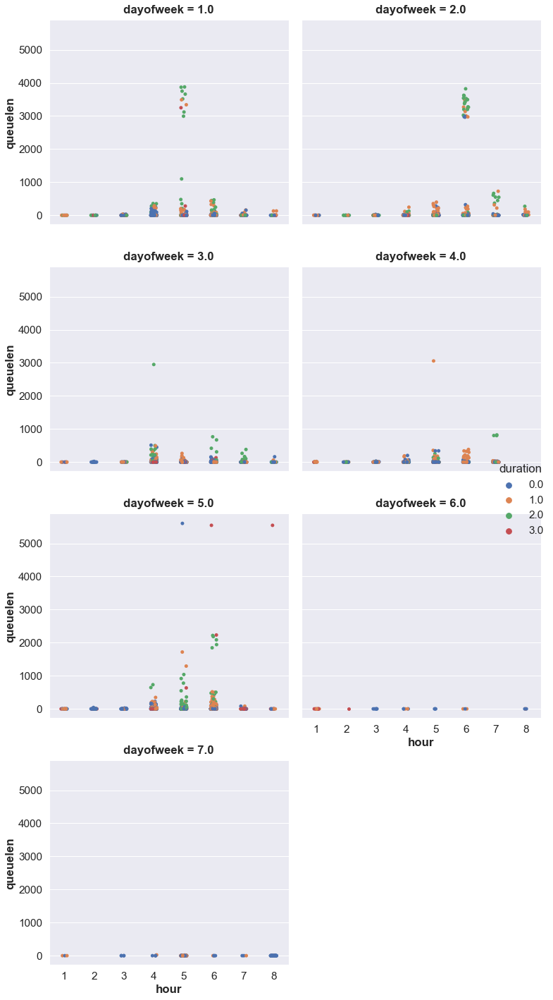

In [78]:
data_poly['duration'] = data_imputed_y

sns.catplot(data=data_poly, x='hour', y='queuelen', col='dayofweek', col_wrap=2, hue='duration')

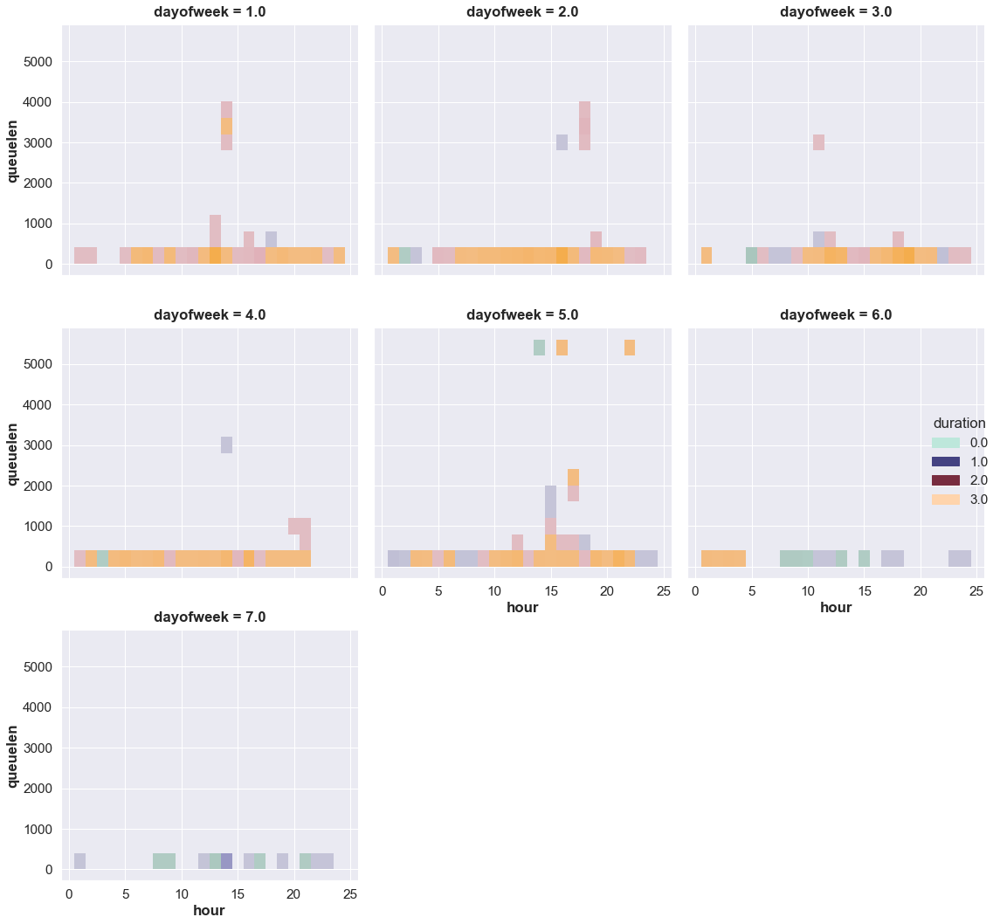

In [146]:
sns.displot(data_poly, x='hour', y='queuelen', col='dayofweek',hue='duration',col_wrap=3, palette='icefire')

In [79]:
data_poly = data_poly.drop('duration', axis=1)

In [80]:
base_list = ['time', 'dayofweek', 'queuelen',
         'type_was_missing', 'params_was_missing']

results = cross_validate(rf, data_poly[base_list+add_list2], data_imputed_y.values.ravel(), cv=10, scoring=('accuracy','roc_auc_ovr'))
results['test_accuracy'].mean()

0.8248452322870928

Binning doees not have a effect 

###  PASS

<a id='week'><a>
    
### 2c) One Hot Encode Week


[Back To Table](#table)

In [81]:
base_list = ['time', 'dayofweek', 'queuelen',
         'type_was_missing', 'params_was_missing']

data_poly = data_poly[base_list+add_list2]


In [82]:
data_poly = data_poly.rename(columns={"poly__x0": "type", "poly__x1": "models",'poly__x0 x3':"type*trial", 'poly__x2 x3':'params*trial'})

In [83]:
ohe = ColumnTransformer([('ohe', OneHotEncoder(), ['dayofweek'])], remainder='passthrough' )

In [84]:
data_ohe = ohe.fit_transform(data_poly)

In [85]:
data_ohe = pd.DataFrame(data_ohe, columns = ohe.get_feature_names())

In [86]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0)
results = cross_validate(rf, data_ohe, data_imputed_y.values.ravel(), cv=10, scoring=('accuracy','roc_auc_ovr'))
results['test_accuracy'].mean()

0.8129798883287256

Does not seem to help either


<a id='examine'><a>
    
### 2d) Examine Results


[Back To Table](#table)

In [110]:
data_poly = data_poly[base_list+add_list2]
data_poly = data_poly.rename(columns={"poly__x0": "type", "poly__x1": "models",'poly__x0 x3':"type*trial", 'poly__x2 x3':'params*trial'})
data_poly.head()

,time,dayofweek,queuelen,type_was_missing,params_was_missing,type,models,type*trial,params*trial
0,0.568056,2.0,0.0,0.0,0.0,13.0,148.0,520.0,450080.0
1,0.715972,2.0,0.0,0.0,0.0,12.0,7.0,480.0,236920.0
2,0.222917,5.0,1.0,0.0,0.0,13.0,62.0,260.0,38120.0
3,0.424306,5.0,30.0,0.0,0.0,5.0,8.0,200.0,160920.0
4,0.672222,5.0,0.0,0.0,0.0,12.0,1.0,480.0,99200.0


#### Base Model

In [111]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0)


results = cross_validate(rf, data_poly,data_imputed_y.values.ravel(), scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'],cv=10 )
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.822114706998428
f1_micro :  0.822114706998428
f1_macro :  0.7776034697035055
roc_auc_ovr :  0.9461214081301259


In [112]:
def classification_report_with_accuracy_score(y_true, y_pred):

    print(classification_report(y_true, y_pred)) # print classification report
    return accuracy_score(y_true, y_pred) # return accuracy score

results = cross_validate(rf, data_poly,data_imputed_y.values.ravel(), scoring=make_scorer(classification_report_with_accuracy_score),cv=10 )

              precision    recall  f1-score   support

         0.0       0.88      0.94      0.91       219
         1.0       0.81      0.81      0.81       134
         2.0       0.80      0.65      0.72        51
         3.0       0.91      0.77      0.83        26

    accuracy                           0.85       430
   macro avg       0.85      0.79      0.82       430
weighted avg       0.85      0.85      0.85       430

              precision    recall  f1-score   support

         0.0       0.86      0.93      0.89       219
         1.0       0.76      0.75      0.75       134
         2.0       0.80      0.63      0.70        51
         3.0       0.81      0.65      0.72        26

    accuracy                           0.82       430
   macro avg       0.81      0.74      0.77       430
weighted avg       0.82      0.82      0.82       430

              precision    recall  f1-score   support

         0.0       0.88      0.94      0.91       219
         1.0       0.

So far the model is having difficulty get all the rows from label 2 and 3

#### Test models with weighted class 

Best results


In [113]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:3,3:1})
results = cross_validate(rf, data_poly,data_imputed_y.values.ravel(), scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'],cv=10 )
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.8223537702607471
f1_micro :  0.8223537702607471
f1_macro :  0.7829281312851852
roc_auc_ovr :  0.9458431586289893


Trial Results

In [114]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:3,3:1})
results = cross_validate(rf, data_poly,data_imputed_y.values.ravel(), scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'],cv=10 )
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.8223537702607471
f1_micro :  0.8223537702607471
f1_macro :  0.7829281312851852
roc_auc_ovr :  0.9458431586289893


#### Compare with single , no cv

              precision    recall  f1-score   support

         0.0       0.85      0.92      0.89       634
         1.0       0.77      0.71      0.74       426
         2.0       0.63      0.55      0.59       150
         3.0       0.78      0.72      0.75        79

    accuracy                           0.80      1289
   macro avg       0.76      0.73      0.74      1289
weighted avg       0.79      0.80      0.79      1289

Predictions (array([0., 1., 2., 3.]), array([689, 395, 132,  73], dtype=int64))


FixedFormatter should only be used together with FixedLocator


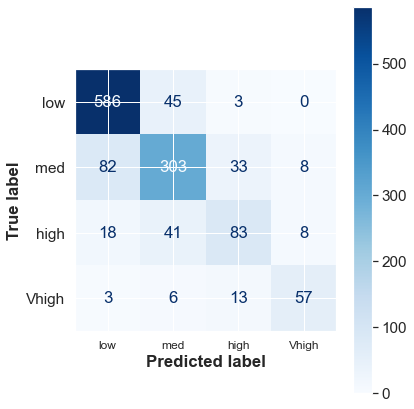

In [115]:
train_x, test_x , train_y, test_y = train_test_split(data_poly, data_imputed_y.values.ravel(), test_size=0.3, random_state=12)
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0)
rf.fit(train_x,train_y)
y_pred = rf.predict(test_x)
print(classification_report(test_y, y_pred))
print(f'Predictions {np.unique(y_pred, return_counts=True)}')

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.4)
ax.set_xticklabels(ax.get_xticks(), size = 12)
plot_confusion_matrix(rf,test_x, test_y , 
                      cmap=plt.cm.Blues,
                      #normalize='true',  
                      display_labels=['low','med','high','Vhigh'],
                      ax=ax
                     )
plt.show()


              precision    recall  f1-score   support

         0.0       0.85      0.93      0.89       634
         1.0       0.77      0.72      0.74       426
         2.0       0.65      0.55      0.59       150
         3.0       0.76      0.72      0.74        79

    accuracy                           0.80      1289
   macro avg       0.76      0.73      0.74      1289
weighted avg       0.79      0.80      0.80      1289

Predictions (array([0., 1., 2., 3.]), array([692, 395, 127,  75], dtype=int64))


FixedFormatter should only be used together with FixedLocator


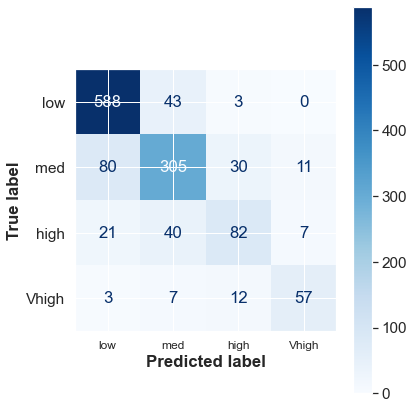

In [116]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:3,3:1})
rf.fit(train_x,train_y)
y_pred = rf.predict(test_x)
print(classification_report(test_y, y_pred))
print(f'Predictions {np.unique(y_pred, return_counts=True)}')

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.4)
ax.set_xticklabels(ax.get_xticks(), size = 12)
plot_confusion_matrix(rf,test_x, test_y , 
                      cmap=plt.cm.Blues,
                      #normalize='true',  
                      display_labels=['low','med','high','Vhigh'],
                      ax=ax
                     )
plt.show()

Find that misclassification for low and Vhigh are too extreme.
There are vhigh and high labels that are predicted as low 
Therea are med labels that are predicted as vhigh

In [117]:
test_x['pred'] = y_pred
test_x['true'] = test_y


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [118]:
print('These are the 11 rows that are misclassified as low when high')
test_x[(test_x['pred']==0) & (test_x['true']==2)]

These are the 11 rows that are misclassified as low when high


,time,dayofweek,queuelen,type_was_missing,params_was_missing,type,models,type*trial,params*trial,pred,true
247,0.838889,3.0,0.0,1.0,0.0,11.0,7.0,440.0,1889760.0,0.0,2.0
3421,0.585417,2.0,0.0,1.0,0.0,7.0,26.0,280.0,192960.0,0.0,2.0
4049,0.319444,4.0,0.0,0.0,0.0,5.0,7.0,200.0,1259320.0,0.0,2.0
869,0.570139,1.0,16.0,1.0,0.0,8.0,34.0,320.0,65600.0,0.0,2.0
445,0.575000,4.0,253.0,0.0,0.0,13.0,24.0,520.0,18080.0,0.0,2.0
3095,0.678472,2.0,0.0,1.0,0.0,11.0,1.0,2200.0,259400.0,0.0,2.0
477,0.581944,3.0,3.0,1.0,0.0,10.0,14.0,400.0,68200.0,0.0,2.0
1393,0.465278,1.0,170.0,0.0,0.0,9.0,11.0,360.0,38840.0,0.0,2.0
37,0.584028,2.0,0.0,0.0,1.0,5.0,26.0,200.0,197320.0,0.0,2.0
3953,0.852778,3.0,0.0,1.0,0.0,11.0,7.0,440.0,280720.0,0.0,2.0


In [119]:
print('These are the 2 rows that are misclassified as low when vhigh')
test_x[(test_x['pred']==0) & (test_x['true']==3)]

These are the 2 rows that are misclassified as low when vhigh


,time,dayofweek,queuelen,type_was_missing,params_was_missing,type,models,type*trial,params*trial,pred,true
2895,0.644444,5.0,0.0,1.0,0.0,7.0,24.0,280.0,349520.0,0.0,3.0
1625,0.809722,1.0,0.0,0.0,1.0,13.0,11.0,520.0,567560.0,0.0,3.0
3365,0.759028,2.0,0.0,1.0,0.0,8.0,147.0,320.0,513840.0,0.0,3.0


In [120]:
test_x[test_x['queuelen']<200]

,time,dayofweek,queuelen,type_was_missing,params_was_missing,type,models,type*trial,params*trial,pred,true
2172,0.390972,3.0,0.0,1.0,0.0,7.0,3.0,280.0,76760.0,0.0,1.0
2036,0.657639,3.0,0.0,0.0,0.0,8.0,31.0,320.0,1007840.0,0.0,0.0
3070,0.773611,1.0,0.0,0.0,0.0,5.0,6.0,200.0,54840.0,0.0,0.0
339,0.545139,7.0,0.0,0.0,1.0,9.0,42.0,360.0,20320.0,1.0,1.0
1412,0.485417,4.0,0.0,0.0,0.0,3.0,1.0,120.0,3240.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
3232,0.622917,4.0,0.0,0.0,1.0,9.0,5.0,180.0,75200.0,0.0,0.0
1481,0.588194,4.0,0.0,0.0,0.0,8.0,4.0,320.0,3724120.0,0.0,0.0
679,0.555556,1.0,77.0,0.0,0.0,9.0,18.0,360.0,50840.0,0.0,1.0
1933,0.783333,3.0,0.0,0.0,0.0,14.0,16.0,5600.0,516800.0,3.0,3.0


#### Test [ 'params*trials/type*trial']  to see if it might better segregate the various classes

In [121]:
data_poly['params*trials/type*trial'] = data_poly['params*trial']/(data_poly['type*trial']+1)

In [122]:
data_poly['params*trials/type*trial'] = data_poly['params*trials/type*trial'].round()

In [123]:
print(data['type'].unique())
print('Found that there is mislabelling in sequence resulting in type*trial with 0 values resulting in division by zero')
data_poly[data_poly['type*trial']<1].head()

[13. 12.  5.  9. 11.  0.  8. nan  7.  6.  4.  2.  3. 14. 10.]
Found that there is mislabelling in sequence resulting in type*trial with 0 values resulting in division by zero


,time,dayofweek,queuelen,type_was_missing,params_was_missing,type,models,type*trial,params*trial,params*trials/type*trial
11,0.329861,1.0,0.0,0.0,0.0,0.0,13.0,0.0,177840.0,177840.0
27,0.475000,5.0,0.0,0.0,0.0,0.0,21.0,0.0,542600.0,542600.0
176,0.539583,3.0,0.0,0.0,0.0,0.0,216.0,0.0,120920.0,120920.0
195,0.400694,3.0,0.0,0.0,0.0,0.0,221.0,0.0,69640.0,69640.0
337,0.312500,4.0,0.0,0.0,0.0,0.0,205.0,0.0,273680.0,273680.0


In [124]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:2,3:1})
results = cross_validate(rf, data_poly, data_imputed_y.values.ravel(),cv=10 , scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'])
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.8204868000216837
f1_micro :  0.8204868000216837
f1_macro :  0.7759819024506697
roc_auc_ovr :  0.9455022420251453


### PASS
<a id='restructure'><a>
    
### 2E)  Restructure Data

[Back To Table](#table)



#### Fill the null values in 'type' with 1
As 1 is missing  from the labels available 

In [74]:
data['type'] = data['type'].fillna(1)

data['params_was_missing'] = data['params'].isnull().values
data['params_was_missing'] = data['params_was_missing']*1

imputer = KNNImputer(n_neighbors = 5)
data_imputed = imputer.fit_transform(data)


np.set_printoptions(suppress=True)
data_imputed = pd.DataFrame(data_imputed, columns = data.columns.values)
data_imputed[['params']] = data_imputed[['params']].round()
data_imputed.tail()



,type,time,dayofweek,models,params,queuelen,trials,duration,params_was_missing
4326,8.0,0.704167,5.0,16.0,30957.0,0.0,40.0,0.0,0.0
4327,14.0,0.503472,5.0,1.0,1315.0,0.0,200.0,2.0,0.0
4328,1.0,0.925694,1.0,31.0,1507.0,130.0,40.0,1.0,0.0
4329,9.0,0.435417,2.0,5.0,6272.0,0.0,40.0,0.0,1.0
4330,4.0,0.609028,5.0,15.0,2629.0,0.0,20.0,0.0,1.0


In [78]:
data_imputed['type*trials'] = data_imputed['type']*data_imputed['trials']
data_imputed['params*trials'] = data_imputed['params']*data_imputed['trials']
data_imputed['divide'] = data_imputed['params*trials']/(data_imputed['type*trials']+1)
data_imputed = data_imputed.drop(['type*trials','params*trials'], axis=1)
data_imputed.head()

,type,time,dayofweek,models,params,queuelen,trials,duration,params_was_missing,divide
0,13.0,0.568056,2.0,148.0,11252.0,0.0,40.0,2.0,0.0,863.877159
1,12.0,0.715972,2.0,7.0,5923.0,0.0,40.0,1.0,0.0,492.557173
2,13.0,0.222917,5.0,62.0,1906.0,1.0,20.0,0.0,0.0,146.053640
3,5.0,0.424306,5.0,8.0,4023.0,30.0,40.0,0.0,0.0,800.597015
4,12.0,0.672222,5.0,1.0,2480.0,0.0,40.0,1.0,0.0,206.237006


In [79]:
y = data_imputed['duration']
x = data_imputed.drop('duration', axis=1)

In [80]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:2,3:1})
results = cross_validate(rf, x, y,cv=10 , scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'])
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.8222049573759327
f1_micro :  0.8222049573759327
f1_macro :  0.7799733390781475
roc_auc_ovr :  0.942248636391841


#### Test with nonull

In [3]:
nonull_df = data[data.notnull().all(axis=1)].copy()

In [4]:
backup = nonull_df.copy()

nonull_df['type*trials'] = nonull_df['type']*nonull_df['trials']
nonull_df['params*trials'] = nonull_df['params']*nonull_df['trials']
nonull_df['divide'] = nonull_df['params*trials']/(nonull_df['type*trials']+1)
nonull_df = nonull_df.drop(['params','trials'], axis=1)
nonull_df.head()

,type,time,dayofweek,models,queuelen,duration,type*trials,params*trials,divide
0,13.0,0.568056,2.0,148.0,0.0,2.0,520.0,450080.0,863.877159
1,12.0,0.715972,2.0,7.0,0.0,1.0,480.0,236920.0,492.557173
2,13.0,0.222917,5.0,62.0,1.0,0.0,260.0,38120.0,146.053640
3,5.0,0.424306,5.0,8.0,30.0,0.0,200.0,160920.0,800.597015
4,12.0,0.672222,5.0,1.0,0.0,1.0,480.0,99200.0,206.237006


In [10]:
y = nonull_df['duration'].copy()
x = nonull_df.drop('duration', axis=1).copy()

In [128]:
# original no new features
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:2,3:1})
results = cross_validate(rf, backup.iloc[:,:-1], backup['duration'],cv=10 , scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'])
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.834394924172083
f1_micro :  0.834394924172083
f1_macro :  0.7960175606101327
roc_auc_ovr :  0.9491821780646335


In [11]:
# best   create  ['type*trials','params*trials'] drop ['params','trials']   --- > must drop 
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:2,3:1})
results = cross_validate(rf, x, y,cv=10 , scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'])
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.84357397090684
f1_micro :  0.84357397090684
f1_macro :  0.8106579707116273
roc_auc_ovr :  0.9532404470620104


In [12]:
# ['params*trials']/(nonull_df['type*trials']+1  drop  ['params','trials']  --- > must drop 
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:2,3:1})
results = cross_validate(rf, x, y,cv=10 , scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'])
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.84357397090684
f1_micro :  0.84357397090684
f1_macro :  0.8106579707116273
roc_auc_ovr :  0.9532404470620104


### New feature 

In [13]:
nonull_df.groupby(['type'])['models'].mean()

type
0.0      49.844156
2.0      80.160584
3.0     376.581395
4.0     650.457831
5.0     602.706667
6.0      36.516667
7.0      32.996255
8.0      23.901587
9.0      27.429803
10.0     44.000000
11.0     24.154229
12.0     17.846154
13.0     31.960920
14.0     25.911340
Name: models, dtype: float64

In [14]:
# creat new feature
nonull_df['mean_param*trial/type'] = nonull_df['type'].map(nonull_df.groupby(['type'])['params*trials'].mean().round())
y = nonull_df['duration'].copy()
x = nonull_df.drop('duration', axis=1).copy()

In [15]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=12, class_weight={0:1, 1:1, 2:2,3:1})
results = cross_validate(rf, x, y,cv=10 , scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'])
print(f"Accuracy :  {results['test_accuracy'].mean()}")
print(f"f1_micro :  {results['test_f1_micro'].mean()}")
print(f"f1_macro :  {results['test_f1_macro'].mean()}")
print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")

Accuracy :  0.8441233364283504
f1_micro :  0.8441233364283504
f1_macro :  0.8133821099988993
roc_auc_ovr :  0.9550232562309413


              precision    recall  f1-score   support

         0.0       0.89      0.92      0.90       553
         1.0       0.74      0.76      0.75       336
         2.0       0.71      0.59      0.64       126
         3.0       0.89      0.78      0.83        63

    accuracy                           0.82      1078
   macro avg       0.81      0.76      0.78      1078
weighted avg       0.82      0.82      0.82      1078

Predictions (array([0., 1., 2., 3.]), array([574, 345, 104,  55], dtype=int64))


<ipython-input-142-68df505cb441>:11: UserWarning:

FixedFormatter should only be used together with FixedLocator



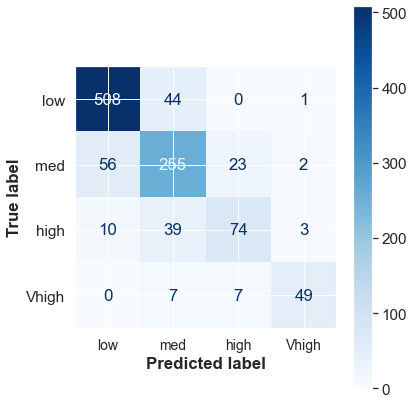

In [142]:


#train_x, test_x , train_y, test_y = train_test_split(x.drop(['queuelen','dayofweek','time'], axis=1), y, test_size=0.3, random_state=1)
train_x, test_x , train_y, test_y = train_test_split(x, y, test_size=0.3, random_state=0)
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:2,3:1},criterion='gini')
rf.fit(train_x,train_y)
y_pred = rf.predict(test_x)
print(classification_report(test_y, y_pred))
print(f'Predictions {np.unique(y_pred, return_counts=True)}')

fig, ax = plt.subplots(figsize=(6, 6))
sns.set(font_scale=1.4)
ax.set_xticklabels(ax.get_xticks(), size = 14)
plot_confusion_matrix(rf,test_x, test_y , 
                      cmap=plt.cm.Blues,
                      #normalize='true',  
                      display_labels=['low','med','high','Vhigh'],
                      ax=ax
                     )
plt.show()

### Set threshold

### ROC AUC

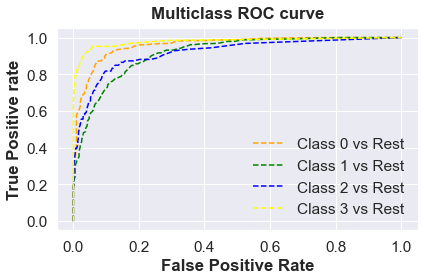

In [445]:
# roc curve for classes

proba = rf.predict_proba(test_x)
pred = rf.predict(test_x)


fpr = {}
tpr = {}
thresh ={}

n_class = 4

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(test_y, proba[:,i], pos_label=i)
    
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.plot(fpr[3], tpr[3], linestyle='--',color='yellow', label='Class 3 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.show()
#plt.savefig('Multiclass ROC',dpi=300);

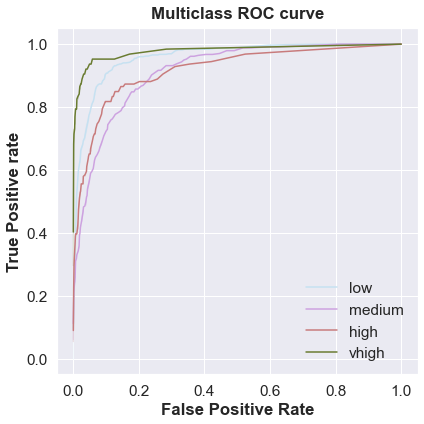

In [467]:
d = {}
for labels in rf.classes_:
    label = int(labels)
    d[label] = roc_curve(test_y, proba[:,label], pos_label=label)

plt.figure(figsize=(6,6))
sns.set_palette('cubehelix_r')
sns.lineplot(x=d[0][0],y=d[0][1], label ='low')
sns.lineplot(x=d[1][0],y=d[1][1],label = 'medium')
sns.lineplot(x=d[2][0],y=d[2][1], label='high')
sns.lineplot(x=d[3][0],y=d[3][1], label='vhigh')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend()
plt.show()

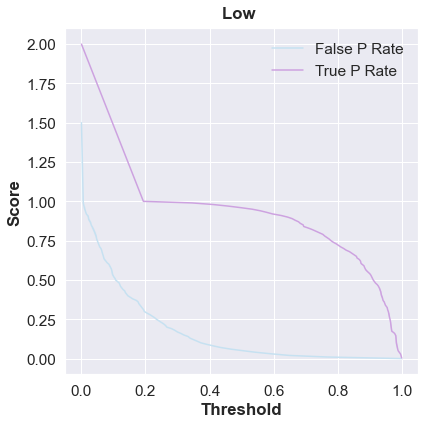

In [512]:

plt.figure(figsize=(6,6))
sns.set_palette('cubehelix_r')
sns.lineplot(x=d[0][0],y=d[0][2], label ='False P Rate')
sns.lineplot(x=d[0][1],y=d[0][2],label = 'True P Rate')

plt.title('Low ')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.legend()
plt.show()

In [492]:
#indx = np.where((d[3][1] > 0.94) & (d[3][1] < 0.97) )
indx = np.where(d[0][1]>0.95 )

In [493]:
d[0][1][indx]

array([0.95479204, 0.95479204, 0.95660036, 0.95840868, 0.960217  ,
       0.960217  , 0.96202532, 0.96202532, 0.96383363, 0.96564195,
       0.96564195, 0.96745027, 0.96745027, 0.96745027, 0.96925859,
       0.96925859, 0.97830018, 0.98191682, 0.98191682, 0.98372514,
       0.98372514, 0.98372514, 0.98372514, 0.98734177, 0.98734177,
       0.98915009, 0.99276673, 0.99638336, 0.99819168, 1.        ,
       1.        ])

In [495]:
d[0][0][indx]

array([0.18666667, 0.19047619, 0.19428571, 0.19619048, 0.20380952,
       0.21333333, 0.22095238, 0.22857143, 0.23428571, 0.24190476,
       0.25714286, 0.26285714, 0.26666667, 0.28190476, 0.29142857,
       0.29904762, 0.31047619, 0.32      , 0.33333333, 0.33904762,
       0.37333333, 0.39238095, 0.41333333, 0.43619048, 0.46666667,
       0.5047619 , 0.5447619 , 0.59428571, 0.64952381, 0.76761905,
       1.        ])

In [496]:
d[0][2][indx]

array([0.33, 0.32, 0.31, 0.3 , 0.29, 0.28, 0.27, 0.26, 0.25, 0.24, 0.22,
       0.21, 0.2 , 0.19, 0.18, 0.17, 0.16, 0.15, 0.14, 0.13, 0.1 , 0.09,
       0.08, 0.07, 0.06, 0.05, 0.04, 0.03, 0.02, 0.01, 0.  ])

In [486]:
indx

(array([39, 40, 41, 42, 43, 44], dtype=int64),)

In [487]:
d[3][2]

47

In [415]:
roc_auc_score(test_y, rf.predict_proba(test_x), multi_class='ovr')

0.9428045946738781

### precision and recall


In [ ]:
#for  thres in np.linspace(.5,1,51)

proba = rf.predict_proba(test_x)
pred = rf.predict(test_x)
new_pred = pred.copy()

p_weighted = []
p_macro = []
r_weighted = []
r_macro = []
low_indx = np.where(pred==0)

for  thres in np.linspace(.35,1,61):
    new_pred = pred.copy()
    for row in low_indx[0]:
        if proba[row, 0] < thres:
            new_pred[row] = np.argmax(proba[row,1:])+1
            
    p_weighted.append(precision_score(test_y,new_pred, average='weighted'))           
    p_macro.append(precision_score(test_y,new_pred, average='macro'))       

    r_weighted.append(recall_score(test_y,new_pred, average='weighted'))
    r_macro.append(recall_score(test_y,new_pred, average='macro'))
    
    
df_metric = np.array([ np.linspace(.4,1,61),p_weighted, p_macro, r_weighted, r_macro])
thres_metric = pd.DataFrame(df_metric.T, columns =['t','precision weighted','precision macro', 'recall weighted', 'recall macro'])

#vhigh_idx = np.where(pred==3)
#for row in vhigh_idx[0]:
#    if proba[row, 3] < 0.51:
#        new_pred[row] = np.argmax(proba[row,0:3])

<AxesSubplot:xlabel='t'>

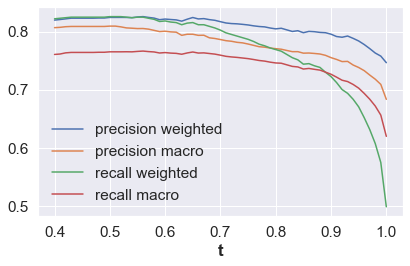

In [360]:
thres_metric.set_index('t').plot()

In [372]:
thres_metric['pred_macro_precision'] = 0.81
thres_metric['pred_weighted_precision'] = 0.82
thres_metric['pred_macro_recall'] = 0.76
thres_metric['pred_weighted_recall'] = 0.82

<AxesSubplot:xlabel='t'>

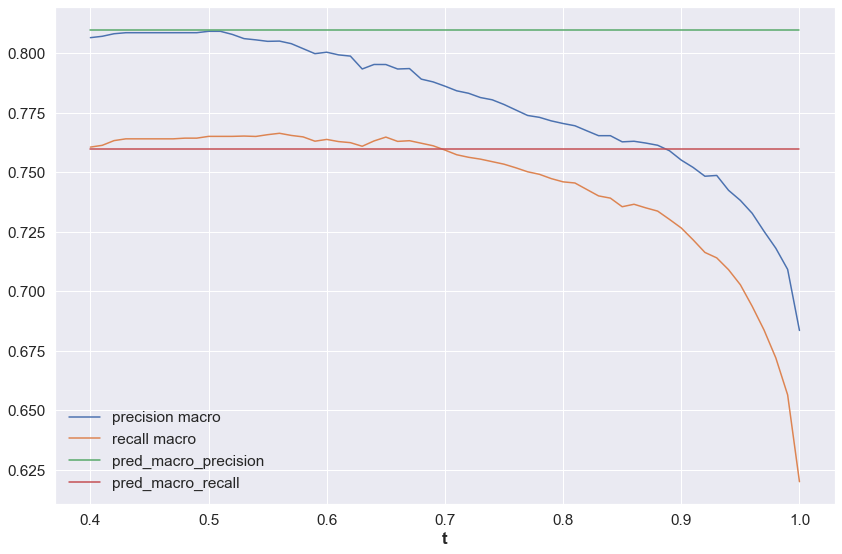

In [401]:

thres_metric[['precision macro','recall macro','pred_macro_precision', 'pred_macro_recall','t']].set_index('t').plot(figsize=(12,8))

#### Compare with new pediction

In [520]:
new_pred = pred.copy()
low_indx = np.where(pred==0)
for row in low_indx[0]:
    if proba[row, 0] < 0.49:
        new_pred[row] = np.argmax(proba[row,1:])+1

In [521]:
#new

print(classification_report(test_y,new_pred))

              precision    recall  f1-score   support

         0.0       0.90      0.92      0.91       553
         1.0       0.74      0.77      0.76       336
         2.0       0.70      0.60      0.64       126
         3.0       0.89      0.78      0.83        63

    accuracy                           0.83      1078
   macro avg       0.81      0.77      0.78      1078
weighted avg       0.82      0.83      0.82      1078



In [519]:
# old original

print(classification_report(test_y,pred))

              precision    recall  f1-score   support

         0.0       0.89      0.92      0.90       553
         1.0       0.74      0.76      0.75       336
         2.0       0.71      0.59      0.64       126
         3.0       0.89      0.78      0.83        63

    accuracy                           0.82      1078
   macro avg       0.81      0.76      0.78      1078
weighted avg       0.82      0.82      0.82      1078



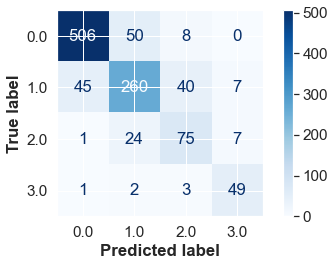

In [262]:
# order of input is important
# wrong example

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(new_pred,test_y, labels=rf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=rf.classes_)
disp.plot(cmap=plt.cm.Blues)

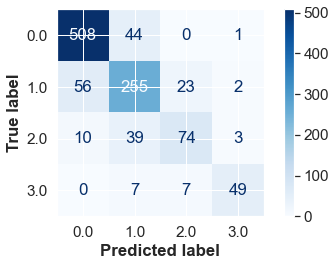

In [516]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

sns.set(font_scale=1.4)
cm = confusion_matrix(test_y, new_pred, labels=rf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=rf.classes_)
disp.plot(cmap=plt.cm.Blues)



<a id='tuning'><a>
    
### 3)  Hyperparameter Tuning

[Back To Table](#table)


#### Search for best class weights

In [265]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0)
param_grid = {'class_weight': [{0:1, 1:1, 2:i, 3:1} for i in np.linspace(1,3,30)]}
scoring = {'accuracy':make_scorer(accuracy_score),'f1_score':make_scorer(roc_auc_score, needs_proba=True,multi_class='ovr')}

grid = GridSearchCV(estimator=rf, param_grid=param_grid, scoring=['accuracy','f1_macro','f1_weighted','roc_auc_ovr','balanced_accuracy'],refit='accuracy', cv=5,n_jobs=-1)
results = grid.fit(x,y)

In [268]:
print(grid.best_params_)
df = pd.DataFrame(results.cv_results_)
df.head()

{'class_weight': {0: 1, 1: 1, 2: 2.103448275862069, 3: 1}}


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_class_weight,params,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,...,std_test_roc_auc_ovr,rank_test_roc_auc_ovr,split0_test_balanced_accuracy,split1_test_balanced_accuracy,split2_test_balanced_accuracy,split3_test_balanced_accuracy,split4_test_balanced_accuracy,mean_test_balanced_accuracy,std_test_balanced_accuracy,rank_test_balanced_accuracy
0,0.494991,0.114256,0.286600,0.063662,"{0: 1, 1: 1, 2: 1.0, 3: 1}","{'class_weight': {0: 1, 1: 1, 2: 1.0, 3: 1}}",0.852573,0.833102,0.835883,0.835883,...,0.003826,8,0.805602,0.767991,0.772219,0.787677,0.792663,0.785230,0.013731,6
1,0.516125,0.169054,0.164749,0.060789,"{0: 1, 1: 1, 2: 1.0689655172413792, 3: 1}","{'class_weight': {0: 1, 1: 1, 2: 1.06896551724...",0.859527,0.831711,0.835883,0.823366,...,0.005216,15,0.808260,0.766463,0.774475,0.779430,0.800404,0.785807,0.015878,4
2,0.549742,0.120078,0.175800,0.028326,"{0: 1, 1: 1, 2: 1.1379310344827587, 3: 1}","{'class_weight': {0: 1, 1: 1, 2: 1.13793103448...",0.853964,0.830320,0.838665,0.830320,...,0.003455,10,0.812258,0.768456,0.780974,0.779105,0.791216,0.786402,0.014809,2
3,0.606996,0.060093,0.200005,0.066985,"{0: 1, 1: 1, 2: 1.206896551724138, 3: 1}","{'class_weight': {0: 1, 1: 1, 2: 1.20689655172...",0.848401,0.838665,0.840056,0.834492,...,0.001501,28,0.790461,0.771573,0.785179,0.787408,0.776872,0.782299,0.007008,14
4,0.574073,0.075919,0.178430,0.045576,"{0: 1, 1: 1, 2: 1.2758620689655173, 3: 1}","{'class_weight': {0: 1, 1: 1, 2: 1.27586206896...",0.858136,0.835883,0.833102,0.824757,...,0.002727,1,0.800190,0.773452,0.767976,0.776782,0.792524,0.782185,0.012153,15


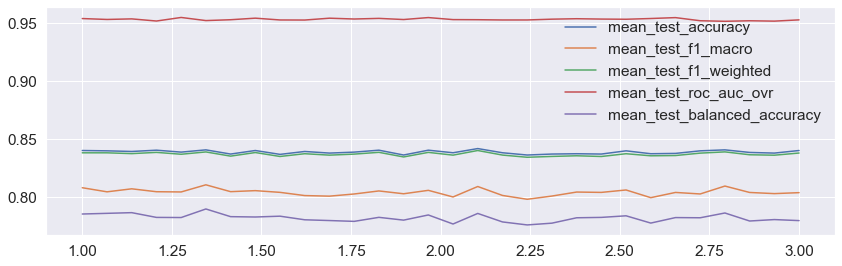

In [269]:
plt.figure(figsize=(12,4))
for score in ['mean_test_accuracy','mean_test_f1_macro','mean_test_f1_weighted','mean_test_roc_auc_ovr','mean_test_balanced_accuracy']:
    plt.plot([_[2] for _ in df['param_class_weight']], df[score], label=score)
plt.legend()
    

---

#### Using Optuna use Abask

In [241]:
# multiple conditions

def optimize(trial, x ,y):
    n_estimators = trial.suggest_int('n_estimators',50,1500)
    criterion = trial.suggest_categorical('criterion',['gini','entropy'])
    min_samples_leaf = trial.suggest_int('min_samples_leaf',1,5)
    #class_weight = trial.suggest_categorical('class_weight',[{0:1, 1:1, 2:i, 3:1} for i in range(1,5)])
    #max_feat = trial.suggest_categorical('max_features', [30, 'sqrt', 'log2'])
    model = RandomForestClassifier(
        n_estimators = n_estimators,
        #max_features = max_feat,
        criterion = criterion,
        min_samples_leaf=min_samples_leaf,
        #class_weight = class_weight,
    )
    # use StratifiedKFolds if classifier
    kf = StratifiedKFold(n_splits=5)
    accuracy=[]
    f1_micro=[]
    f1_macro=[]
    f1_weighted=[]
    #roc_auc_score = []
    for idx in kf.split(X=x,y=y):
        train_idx, test_idx=idx[0], idx[1]
        xtrain = x.iloc[train_idx]
        ytrain = y.iloc[train_idx]
        
        xtest = x.iloc[test_idx]
        ytest = y.iloc[test_idx]
        
        model.fit(xtrain,ytrain)
        preds= model.predict(xtest)
        fold_accuracy = accuracy_score(ytest,preds)
        fold_f1_micro = f1_score(ytest,preds, average='micro')
        fold_f1_macro = f1_score(ytest,preds, average='macro')
        fold_f1_weighted = f1_score(ytest,preds, average='weighted')
        #roc_auc_score(test_y, rf.predict_proba(test_x), multi_class='ovr')
        #fold_f1_roc_auc_score = roc_auc_score(ytest,model.predict_proba(xtest),multi_class='ovr')
        accuracy.append(fold_accuracy)
        f1_micro.append(fold_f1_micro)
        f1_macro.append(fold_f1_macro)
        f1_weighted.append(fold_f1_weighted)
        #roc_auc_score.append(roc_auc_score)
    return np.mean(accuracy), np.mean(f1_micro),np.mean(f1_macro),np.mean(f1_weighted)

In [242]:
optimization_function = partial(optimize, x=x, y=y)
study = optuna.create_study(directions=['maximize','maximize','maximize','maximize'])
%time study.optimize(optimization_function, n_trials=10)

[I 2022-01-01 16:55:54,847] A new study created in memory with name: no-name-673acd1d-70a4-4ee4-a325-7e897a7a68ae
[I 2022-01-01 16:56:04,376] Trial 0 finished with values: [0.8331015299026425, 0.8331015299026425, 0.7948576604889095, 0.830601120804378] and parameters: {'n_estimators': 642, 'criterion': 'gini', 'min_samples_leaf': 1}. 
[I 2022-01-01 16:56:11,505] Trial 1 finished with values: [0.8300417246175243, 0.8300417246175243, 0.7882934300299279, 0.8267198423111447] and parameters: {'n_estimators': 475, 'criterion': 'gini', 'min_samples_leaf': 2}. 
[I 2022-01-01 16:56:33,514] Trial 2 finished with values: [0.8311543810848401, 0.8311543810848401, 0.7919635202811536, 0.8286343664997524] and parameters: {'n_estimators': 995, 'criterion': 'entropy', 'min_samples_leaf': 1}. 
[I 2022-01-01 16:56:35,046] Trial 3 finished with values: [0.8125173852573019, 0.8125173852573019, 0.7584899620921888, 0.8065804167305796] and parameters: {'n_estimators': 106, 'criterion': 'gini', 'min_samples_leaf

Wall time: 51.6 s


---

#### my OPTUNA

In [135]:
# use cross validation and lambda

def optimize(trial, x ,y):
    n_estimators = trial.suggest_int('n_estimators',90,120)
    criterion = trial.suggest_categorical('criterion',['gini','entropy'])
    min_samples_leaf = trial.suggest_int('min_samples_leaf',1,5)
    #class_weight = suggest_categorical('class_weight',[{0:1, 1:1, 2:i,3:1} for i in range(1,5)])
    #max_feat = trial.suggest_categorical('max_features', [30, 'sqrt', 'log2'])
    
    model = RandomForestClassifier(
        n_estimators = n_estimators,
        #max_features = max_feat,
        criterion = criterion,
        min_samples_leaf = min_samples_leaf,
        n_jobs=-1, 
        random_state=0, 
        class_weight={0:1, 1:1, 2:2,3:1}
    )
    # use StratifiedKFolds if classifier
    rf = StratifiedKFold(n_splits=5, shuffle=True, random_state= 0)
    results = cross_validate(model, x, y,cv=rf , scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'])
    # print(f"Accuracy :  {results['test_accuracy'].mean()}")
    #print(f"f1_micro :  {results['test_f1_micro'].mean()}")
    # print(f"f1_macro :  {results['test_f1_macro'].mean()}")
    # print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")
    
    fold_accuracy = results['test_accuracy'].mean()
    fold_f1_micro = results['test_f1_micro'].mean()
    fold_f1_macro = results['test_f1_macro'].mean()
    fold_f1_weighted = results['test_roc_auc_ovr'].mean()
    
    return fold_accuracy
    #return fold_accuracy, fold_f1_micro,fold_f1_macro,fold_f1_weighted

In [136]:
#optimization_function = partial(optimize, x=x, y=y)
#study = optuna.create_study(directions=['maximize','maximize','maximize','maximize'])
study = optuna.create_study(directions=['maximize'])
%time study.optimize(lambda trial: optimize(trial, x, y), n_trials=15)

[I 2022-01-04 16:16:53,802] A new study created in memory with name: no-name-82dd1201-dc45-40ec-9578-6b5baf2bf5d5
[I 2022-01-04 16:16:55,277] Trial 0 finished with value: 0.8160366649749535 and parameters: {'n_estimators': 107, 'criterion': 'entropy', 'min_samples_leaf': 5}. Best is trial 0 with value: 0.8160366649749535.
[I 2022-01-04 16:16:56,587] Trial 1 finished with value: 0.8146450695604 and parameters: {'n_estimators': 116, 'criterion': 'entropy', 'min_samples_leaf': 5}. Best is trial 0 with value: 0.8160366649749535.
[I 2022-01-04 16:16:57,866] Trial 2 finished with value: 0.8204880656746255 and parameters: {'n_estimators': 104, 'criterion': 'entropy', 'min_samples_leaf': 4}. Best is trial 2 with value: 0.8204880656746255.
[I 2022-01-04 16:16:59,055] Trial 3 finished with value: 0.8280035332266651 and parameters: {'n_estimators': 114, 'criterion': 'gini', 'min_samples_leaf': 3}. Best is trial 3 with value: 0.8280035332266651.
[I 2022-01-04 16:17:00,211] Trial 4 finished with va

Wall time: 18.4 s


### Optuna remembers trials and can continue from where it ends

In [299]:
study.optimize(lambda trial: optimize(trial, x, y), n_trials=15)

[I 2022-01-02 21:34:13,266] Trial 15 finished with value: 0.8378303198887342 and parameters: {'n_estimators': 108, 'criterion': 'entropy', 'min_samples_leaf': 1}. Best is trial 15 with value: 0.8378303198887342.
[I 2022-01-02 21:34:14,538] Trial 16 finished with value: 0.8344923504867874 and parameters: {'n_estimators': 107, 'criterion': 'entropy', 'min_samples_leaf': 2}. Best is trial 15 with value: 0.8378303198887342.
[I 2022-01-02 21:34:15,702] Trial 17 finished with value: 0.8344923504867872 and parameters: {'n_estimators': 97, 'criterion': 'entropy', 'min_samples_leaf': 1}. Best is trial 15 with value: 0.8378303198887342.
[I 2022-01-02 21:34:16,983] Trial 18 finished with value: 0.835326842837274 and parameters: {'n_estimators': 108, 'criterion': 'entropy', 'min_samples_leaf': 2}. Best is trial 15 with value: 0.8378303198887342.
[I 2022-01-02 21:34:18,148] Trial 19 finished with value: 0.8344923504867872 and parameters: {'n_estimators': 95, 'criterion': 'entropy', 'min_samples_lea

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.


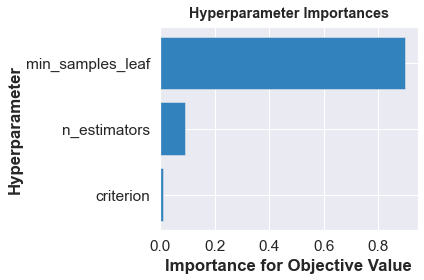

In [137]:
from optuna.visualization.matplotlib import plot_param_importances

plot_param_importances(study);

In [138]:
dir(study)
print(study.best_params)
optuna.visualization.plot_optimization_history(study)

{'n_estimators': 90, 'criterion': 'entropy', 'min_samples_leaf': 1}


### Unpacking straight from results into model

In [307]:
best = {**study.best_params}
best

{'n_estimators': 108, 'criterion': 'entropy', 'min_samples_leaf': 1}

In [310]:
rf = RandomForestClassifier(**study.best_params, class_weight={0:1, 1:1, 2:2,3:1})

resault = cross_validate(rf,x,y, scoring = 'accuracy', cv=10)

In [311]:
pd.DataFrame.from_dict(resault)['test_score'].mean()

0.8411714639430518

In [316]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:2,3:1})

resault = cross_validate(rf,x,y, scoring = 'accuracy', cv=10)
resault['test_score'].mean()

0.8472856700711855

---

#### optuna search

In [271]:
# optuna search 

tree = model = RandomForestClassifier()
param_distributions = {"n_estimators":  optuna.distributions.IntUniformDistribution(199,1500)}
optuna_search = optuna.integration.OptunaSearchCV(tree, param_distributions, cv=5, max_iter =10)
X, y = x,y
optuna_search.fit(X, y)
y_pred = optuna_search.predict(X)

<ipython-input-271-c8018f1605e2>:3: ExperimentalWarning: OptunaSearchCV is experimental (supported from v0.17.0). The interface can change in the future.
  optuna_search = optuna.integration.OptunaSearchCV(tree, param_distributions, cv=5, max_iter =10)
[I 2022-01-01 17:57:42,405] A new study created in memory with name: no-name-9c0ca16f-a904-4df2-b50c-d6c54b09c3c0
[I 2022-01-01 17:57:58,695] Trial 0 finished with value: 0.8350486787204451 and parameters: {'n_estimators': 1075}. Best is trial 0 with value: 0.8350486787204451.
[I 2022-01-01 17:58:07,765] Trial 1 finished with value: 0.8308762169680112 and parameters: {'n_estimators': 581}. Best is trial 0 with value: 0.8350486787204451.
[I 2022-01-01 17:58:28,678] Trial 2 finished with value: 0.8342141863699581 and parameters: {'n_estimators': 1354}. Best is trial 0 with value: 0.8350486787204451.
[I 2022-01-01 17:58:37,310] Trial 3 finished with value: 0.8308762169680112 and parameters: {'n_estimators': 564}. Best is trial 0 with value:

In [270]:
optuna_search.best_params_

{'n_estimators': 864}

---



<a id='pipe'><a>
    
### 3)  Build PipeLine

[Back To Table](#table)

#### Pipeline For No NULL 

In [3]:
base = pd.read_csv(path + '\\noel\data_ml.csv', index_col=0)

In [4]:
base.notnull().all(axis=1)

0        True
1        True
2        True
3        True
4        True
        ...  
4326     True
4327     True
4328    False
4329    False
4330    False
Length: 4331, dtype: bool

In [5]:
def get_nonulls(df):
    return df[df.notnull().all(axis=1)]

transformer = FunctionTransformer(get_nonulls)

#### Pipeline for NULL

In [123]:
base1 = pd.read_csv(path + '\\noel\data_ml.csv', index_col=0)

In [81]:
from sklearn.preprocessing import PowerTransformer
# do not have 2 transforms on the same columns

time_list = ['queuelen']
scale_list = ['params', 'models']
ohe_list = ['type', 'dayofweek']

impute = ColumnTransformer([ 
                            ('log',PowerTransformer(method='yeo-johnson'),time_list),
                            #impute row type with 1
                                ('S_impute',
                                     SimpleImputer(missing_values=np.nan, 
                                                   strategy='constant',
                                                   fill_value=1,
                                                   add_indicator=True ),
                                     ['type'] ),
                            #impute params with nearest neighbors
                                ('K_impute',
                                     KNNImputer(missing_values=np.nan, 
                                     add_indicator=True ),
                                     ['params'] ),
                                ('scaler', StandardScaler(),['models']),
                            #('scaler', StandardScaler(),['params']), # will result in many nulls as transformations are not performed
                                ('ohe', OneHotEncoder( drop='first'),['type','dayofweek']),
        
                                                        
                            ], 
                            remainder='passthrough')

In [50]:
# Ex 2
impute = ColumnTransformer([ #impute row type with 1
                                ('S_impute',
                                     SimpleImputer(missing_values=np.nan, 
                                                   strategy='constant',
                                                   fill_value=1,
                                                   add_indicator=True ),
                                     ['type'] ),
                            #impute params with nearest neighbors
                                ('K_impute',
                                     KNNImputer(missing_values=np.nan, 
                                     add_indicator=True ),
                                     ['params'] ),
                
                                                        
                            ], 
                            remainder='passthrough')

In [44]:
impute = ColumnTransformer([ #impute row type with 1
                                ('K_impute',
                                     KNNImputer(missing_values=np.nan
                                      ),
                                     ['params'] ),
    
                            ], 
                            remainder='passthrough')

In [45]:
aimpute = ColumnTransformer([ #impute row type with 1
                                ('S_impute',
                                     SimpleImputer(missing_values=np.nan, 
                                                   strategy='constant',
                                                   fill_value=1
                                                   ),
                                     ['type'] ),
                                                        
                            ], 
                            remainder='passthrough')

In [82]:
a = impute.fit_transform(base1)
np.isnan(a).sum()

0

In [51]:
# For ex 2
rest_list = base1.drop(['type','params'], axis=1).columns.to_list()
a = pd.DataFrame(a, columns=['type','miss-type','params','miss-params'] + rest_list)
a.head()

,type,miss-type,params,miss-params,time,dayofweek,models,queuelen,trials,duration
0,13.0,0.0,11252.0,0.0,0.568056,2.0,148.0,0.0,40.0,2.0
1,12.0,0.0,5923.0,0.0,0.715972,2.0,7.0,0.0,40.0,1.0
2,13.0,0.0,1906.0,0.0,0.222917,5.0,62.0,1.0,20.0,0.0
3,5.0,0.0,4023.0,0.0,0.424306,5.0,8.0,30.0,40.0,0.0
4,12.0,0.0,2480.0,0.0,0.672222,5.0,1.0,0.0,40.0,1.0


In [125]:
def create_features(df):
    typetrials = df.iloc[:, 0]*df.iloc[:, 6]
    paramstrials = df.iloc[:, 4]*df.iloc[:, 6]
    divide = paramstrials/typetrials
    df = df.drop(df.columns[[4,6]], axis=1)
    df = np.c_[df,typetrials,paramstrials,divide]
    return df

create_features_transformer = FunctionTransformer(create_features)

In [52]:
def create_features(df):
    df['type*trials'] = df.loc[:,'type']*df.loc[:,'trials']
    df['params*trials'] = df.loc[:,'params']*df.loc[:,'trials']
    df['divide'] = df.loc[:,'params*trials']/(df.loc[:,'type*trials']+1)
    df = df.drop(['params','trials'], axis=1)
    return df.copy()

create_features_transformer = FunctionTransformer(create_features)

In [137]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_X_y, check_is_fitted

class FeatureAdder(BaseEstimator, TransformerMixin):
    def __init__(self, addFeatures=True):
        self.addFeatures = addFeatures


    def fit(self, df, y=None):
        # using the helper from sklearn.utils.validation
        # to check the shape of X, y
        df, y = check_X_y(df, y)

        # allows validation through check_is_fitted
        # from sklearn project template example
        self.n_features_ = df.shape[1]

        return self

    def transform(self, df, y=None):

        check_is_fitted(self, 'n_features_')

        # Check input shape, also from sklearn project template
        if df.shape[1] != self.n_features_:
            raise ValueError('Shape of input is different from what was seen'
                             'in `fit`')
        if self.addFeatures:   
            df['type*trials'] = df.loc[:,'type']*df.loc[:,'trials']
            df['params*trials'] = df.loc[:,'params']*df.loc[:,'trials']
            df['divide'] = df.loc[:,'params*trials']/(df.loc[:,'type*trials']+1)
            df = df.drop(df.columns[[4,6]], axis=1)
            df = np.c_[df,df.loc[:,'type*trials'],df.loc[:,'params*trials'],df.loc[:,'divide']]
        return df

    


In [138]:
FeatureAdder().fit_transform(base1[base1.notnull().all(axis=1)], base1[base1.notnull().all(axis=1)].iloc[:,-1])


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


array([[1.30000000e+01, 5.68055556e-01, 2.00000000e+00, ...,
        5.20000000e+02, 4.50080000e+05, 8.63877159e+02],
       [1.20000000e+01, 7.15972222e-01, 2.00000000e+00, ...,
        4.80000000e+02, 2.36920000e+05, 4.92557173e+02],
       [1.30000000e+01, 2.22916667e-01, 5.00000000e+00, ...,
        2.60000000e+02, 3.81200000e+04, 1.46053640e+02],
       ...,
       [1.30000000e+01, 4.44444444e-01, 2.00000000e+00, ...,
        5.20000000e+02, 1.90160000e+05, 3.64990403e+02],
       [8.00000000e+00, 7.04166667e-01, 5.00000000e+00, ...,
        3.20000000e+02, 1.23828000e+06, 3.85757009e+03],
       [1.40000000e+01, 5.03472222e-01, 5.00000000e+00, ...,
        2.80000000e+03, 2.63000000e+05, 9.38950375e+01]])

In [128]:
from sklearn.pipeline import FeatureUnion
# to use only when extracting features that need perform mulitple transformations on the same columns

polypipe = Pipeline([('S',  SimpleImputer(missing_values=np.nan, 
                                                   strategy='constant',
                                                   fill_value=1,
                                                   add_indicator=True )),
                     ('poly',  PolynomialFeatures(degree=3,interaction_only=True))
                    ])

imputePoly = ColumnTransformer([
                                ('polypipe', polypipe, ['type', 'models'])
                               ],remainder='drop')

'''
imputePoly = ColumnTransformer([('impute',   SimpleImputer(missing_values=np.nan, 
                                                   strategy='constant',
                                                   fill_value=1,
                                                   add_indicator=True ), ['type','params']),
                               ('poly',  PolynomialFeatures(degree=3,interaction_only=True), ['type','models'])
                               ],remainder='passthrough')

'''
                     
                     
FeatU = FeatureUnion([  
       ('Features',create_features_transformer),
      ('Poly', imputePoly),                        
                    ])

In [126]:
poly = PolynomialFeatures(degree=3,interaction_only=True)

p = poly.fit_transform(base1[['models','trials']])

p.shape

(4331, 4)

In [124]:
base1.shape

(4331, 8)

In [129]:
#FeatU.fit_transform(base1[base1.notnull().all(axis=1)])
FeatU.fit_transform(base1).shape

(4331, 17)

In [69]:
feature_T = ColumnTransformer([ #onehotencode
                                                                ('S_impute',
                                     SimpleImputer(missing_values=np.nan, 
                                                   strategy='constant',
                                                   fill_value=1,
                                                   add_indicator=False ),
                                     ['type'] ),
                            #impute params with nearest neighbors
                                ('K_impute',
                                     KNNImputer(missing_values=np.nan, 
                                     add_indicator=False ),
                                     ['params'] ),
                                 ('f', FeatU),
                               
                                ],
                                remainder='passthrough'
                                )

In [72]:
categorical = ColumnTransformer([ #onehotencode
                                 ('ohe', OneHotEncoder(handle_unknown='ignore', sparse=False),['type','dayofweek']),
                               
                                ],
                                remainder='passthrough'
                                )

In [92]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:3,3:1})
pipe = Pipeline(steps = [                       
                            ('Im', impute),
                                ('Feat',FeatU),
                           #('cat', categorical),
                         ('impute', StandardScaler()),
                        ('model',rf)
                        ]
               )
#pipe = Pipeline(steps = [('aimpute', aimpute),('cat', categorical)])
#ass= pipe.fit(base1[base1.notnull().all(axis=1)].iloc[:, :-1], base1[base1.notnull().all(axis=1)]['duration'] ) #for use with nonull
ass= pipe.fit(base1.iloc[:, :-1], base1['duration'])

AttributeError: 'numpy.ndarray' object has no attribute 'loc'

In [88]:
from sklearn import set_config
set_config(display='diagram')
ass

Pipeline(steps=[('Im',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('log', PowerTransformer(),
                                                  ['queuelen']),
                                                 ('S_impute',
                                                  SimpleImputer(add_indicator=True,
                                                                fill_value=1,
                                                                strategy='constant'),
                                                  ['type']),
                                                 ('K_impute',
                                                  KNNImputer(add_indicator=True),
                                                  ['params']),
                                                 ('scaler', StandardScaler(),
                                                  ['models']),
                                                 ('ohe',
                                                  OneHotEncoder(drop='first'),
                                                  ['type', 'dayofweek'])])),
                ('impute', StandardScaler()),
                ('model',
                 RandomForestClassifier(class_weight={0: 1, 1: 1, 2: 3, 3: 1},
                                        n_jobs=-1, random_state=0))])

In [151]:
#pipe.fit_transform(base1.iloc[:,:-1], base1.iloc[:,-1])

In [24]:
(ass.predict(base1[base1.notnull().all(axis=1)].iloc[:, :-1])==base1[base1.notnull().all(axis=1)]['duration'])

0       True
1       True
2       True
3       True
4       True
        ... 
4323    True
4324    True
4325    True
4326    True
4327    True
Name: duration, Length: 3595, dtype: bool

In [68]:
cross_validate(pipe,base1.iloc[:, :-1],base1['duration'],cv=5 , scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'])

<a id='pipeoptuna'><a>
    
### 4)  Using pipe in optuna 

[Back To Table](#table)

In [223]:

def optimize(trial, x ,y):
    n_estimators = trial.suggest_int('n_estimators',90,120)
    criterion = trial.suggest_categorical('criterion',['gini','entropy'])
    min_samples_leaf = trial.suggest_int('min_samples_leaf',1,5)
    #class_weight = suggest_categorical('class_weight',[{0:1, 1:1, 2:i,3:1} for i in range(1,5)])
    #max_feat = trial.suggest_categorical('max_features', [30, 'sqrt', 'log2'])
    
    model = RandomForestClassifier(
        n_estimators = n_estimators,
        #max_features = max_feat,
        criterion = criterion,
        min_samples_leaf = min_samples_leaf,
        n_jobs=-1, 
        random_state=0, 
        class_weight={0:1, 1:1, 2:3,3:1}
    )
    
    pipe = Pipeline(steps = [ 
                            ('im', impute),
                         ('impute', StandardScaler()),
                        ('model',model)
                        ]
               )
    # use StratifiedKFolds if classifier
    #rf = StratifiedKFold(n_splits=5, shuffle=True, random_state= 0)
    results = cross_validate(pipe, x, y,cv=5 , scoring=['accuracy','f1_micro','f1_macro','roc_auc_ovr'])
    # print(f"Accuracy :  {results['test_accuracy'].mean()}")
    #print(f"f1_micro :  {results['test_f1_micro'].mean()}")
    # print(f"f1_macro :  {results['test_f1_macro'].mean()}")
    # print(f"roc_auc_ovr :  {results['test_roc_auc_ovr'].mean()}")
    
    fold_accuracy = results['test_accuracy'].mean()
    fold_f1_micro = results['test_f1_micro'].mean()
    fold_f1_macro = results['test_f1_macro'].mean()
    fold_f1_weighted = results['test_roc_auc_ovr'].mean()
    
    return fold_accuracy

In [228]:
study = optuna.create_study(directions=['maximize'])
%time study.optimize(lambda trial: optimize(trial, base1.iloc[:, :-1], base1['duration']), n_trials=15)

[I 2022-01-02 17:18:57,454] A new study created in memory with name: no-name-4b636571-8211-417f-b085-b220accfd248
[I 2022-01-02 17:18:58,912] Trial 0 finished with value: 0.7679484618191795 and parameters: {'n_estimators': 91, 'criterion': 'entropy', 'min_samples_leaf': 5}. Best is trial 0 with value: 0.7679484618191795.
[I 2022-01-02 17:19:00,431] Trial 1 finished with value: 0.783648854189142 and parameters: {'n_estimators': 98, 'criterion': 'entropy', 'min_samples_leaf': 3}. Best is trial 1 with value: 0.783648854189142.
[I 2022-01-02 17:19:01,993] Trial 2 finished with value: 0.764486123208963 and parameters: {'n_estimators': 113, 'criterion': 'entropy', 'min_samples_leaf': 5}. Best is trial 1 with value: 0.783648854189142.
[I 2022-01-02 17:19:03,355] Trial 3 finished with value: 0.7642549099520258 and parameters: {'n_estimators': 90, 'criterion': 'gini', 'min_samples_leaf': 5}. Best is trial 1 with value: 0.783648854189142.
[I 2022-01-02 17:19:04,856] Trial 4 finished with value: 

Wall time: 23.9 s


----

<a id='inter'><a>
    
### 6)  Interpret the model

[Back To Table](#table)  

In [46]:
rf = RandomForestClassifier(n_estimators = 100, n_jobs=-1, random_state=0, class_weight={0:1, 1:1, 2:2,3:1},criterion='gini')
model = rf.fit(x,y)

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(x)

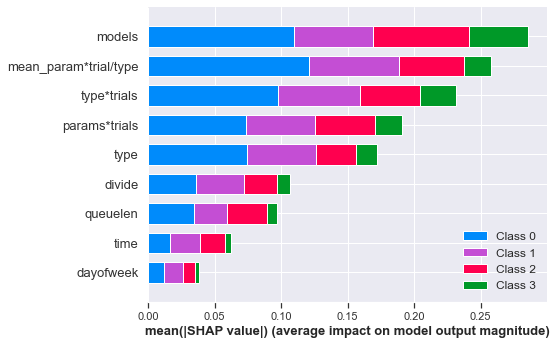

In [47]:
shap.summary_plot(shap_values, x,max_display=x.shape[0])

In [28]:
shap.dependence_plot('models',  np.hstack([shap_values[0], np.zeros(len(shap_values), 0)]), pd.concat([x, y], axis=1),interaction_index=y.name)

TypeError: Cannot interpret '0.1' as a data type

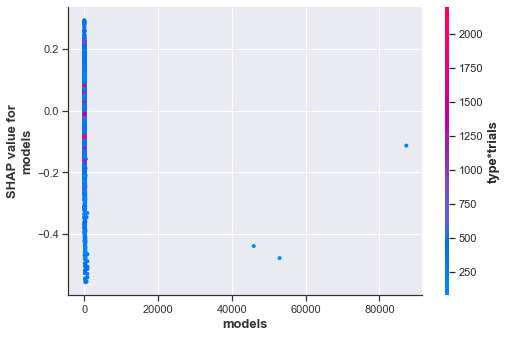

In [24]:
shap.dependence_plot('models', shap_values[0], x,interaction_index=5)

In [49]:
shap.initjs()
shap.force_plot(explainer.expected_value[0],shap_values[0][:500], x)

In [19]:
#sv = explainer(x)


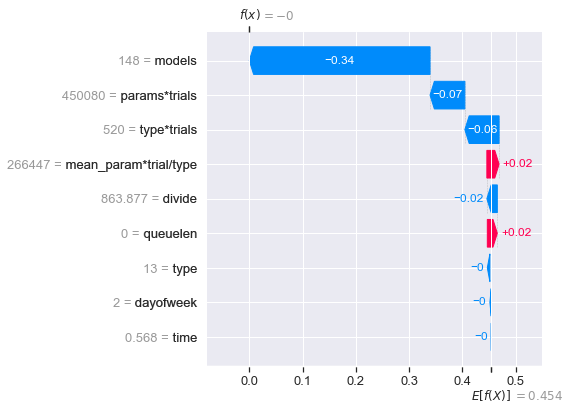

In [50]:

row = 0
shap.plots.waterfall(shap.Explanation(values=shap_values[0][row], 
                                              base_values=explainer.expected_value[0], data=x.iloc[row],  
                                         feature_names=x.columns.tolist()))

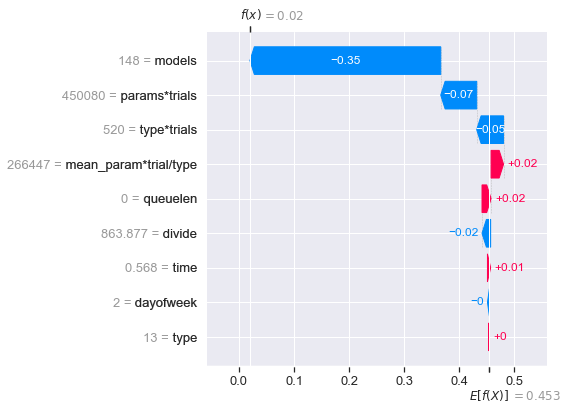

In [16]:

row = 0
shap.waterfall_plot(shap.Explanation(values=shap_values[0][row], 
                                              base_values=explainer.expected_value[0], data=x.iloc[row],  
                                         feature_names=x.columns.tolist()))

In [18]:
i=0
shap.force_plot(explainer.expected_value[0], shap_values[0][i], x.values[i], feature_names = x.columns)


###  [7) Link To Report](test.pdf)


#### Clusteringz

In [ ]:
model = KMeans(n_clusters= 4, max_iter= 500)
model.fit(data.iloc[data.notnull().all(axis=1).values,:-1])
labelled = model.predict(data.iloc[data.notnull().all(axis=1).values,:-1])

In [ ]:
data_clusters = data.loc[data.notnull().all(axis=1).values,:].copy()
data_clusters['cluster']=labelled

In [ ]:
data['trials'].unique()

In [ ]:
sns.lmplot(data=data_clusters, x='params', y='duration', col='type', col_wrap=3, hue='duration')

In [ ]:
fig = px.parallel_coordinates(data[data['models']<500], color="type",
                             color_continuous_scale=px.colors.qualitative.Light24,
                             color_continuous_midpoint=2)
fig.show()

In [275]:
def add(a,b,c):
    c=c*3
    return a+b

In [277]:
fun = lambda c : add(c, 3,4)
